# Train Double U-Net with MoNuSeg dataset

In [1]:
!nvidia-smi

Mon Dec 26 16:18:13 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   61C    P0    28W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!cat /proc/cpuinfo

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 63
model name	: Intel(R) Xeon(R) CPU @ 2.30GHz
stepping	: 0
microcode	: 0x1
cpu MHz		: 2299.998
cache size	: 46080 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 avx2 smep bmi2 erms invpcid xsaveopt arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs mmio_stale_data retbleed
bogomips	: 4599.99
clflush size	: 64
cache_alignment	: 64
address sizes	: 46 bits physical, 48 bits virtual
power

In [3]:
!python --version

Python 3.8.16


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
%cd drive/MyDrive/nuclei_segmentation

/content/drive/.shortcut-targets-by-id/1hmfvFQhEFo3x6BgffnTQEBgnQdsN8Vqy/nuclei_segmentation


In [6]:
# https://github.com/dovahcrow/patchify.py
!pip install patchify

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Make validation set

In [7]:
import os
import glob
import random
import shutil

In [8]:
def create_path(path):
    if not os.path.exists(path):
        os.makedirs(path)

In [9]:
train_dir = "dataset/monuseg/stain_normalized/train"
val_dir = "dataset/monuseg/stain_normalized/validation"

In [10]:
def make_validation_set(val_dir, train_dir, val_size=6, seed=42, fold=None):

    create_path(val_dir)
    create_path(os.path.join(val_dir, "tissue_images"))
    create_path(os.path.join(val_dir, "binary_masks"))
    create_path(os.path.join(val_dir, "instance_masks"))
    create_path(os.path.join(val_dir, "modified_masks"))
    
    for j in sorted(glob.glob(os.path.join(val_dir, "tissue_images", "*"))):
        try:
            shutil.move(j, os.path.join(train_dir, "tissue_images"))
            shutil.move(j.replace("tissue_images", "binary_masks").replace("tif", "png"), 
                        os.path.join(train_dir, "binary_masks"))
            shutil.move(j.replace("tissue_images", "instance_masks").replace("tif", "npy"), 
                        os.path.join(train_dir, "instance_masks"))
            shutil.move(j.replace("tissue_images", "modified_masks").replace("tif", "png"), 
                        os.path.join(train_dir, "modified_masks"))
        except:
            continue

    images_lst = sorted(glob.glob(os.path.join(train_dir, "tissue_images", "*")))
    if fold is None:
        random.seed(seed)
        val_lst = random.sample(images_lst, val_size)
    else:
        val_lst = images_lst[(fold*val_size)-val_size: fold*val_size]
        

    for i in val_lst:
        shutil.move(i, os.path.join(val_dir, "tissue_images"))
        shutil.move(i.replace("tissue_images", "binary_masks").replace("tif", "png"), 
                    os.path.join(val_dir, "binary_masks"))
        shutil.move(i.replace("tissue_images", "instance_masks").replace("tif", "npy"), 
                    os.path.join(val_dir, "instance_masks"))
        shutil.move(i.replace("tissue_images", "modified_masks").replace("tif", "png"), 
                    os.path.join(val_dir, "modified_masks"))
        
    print(f"Validation list: {[os.path.basename(i) for i in val_lst]}")

In [11]:
make_validation_set(val_dir, train_dir, val_size=6, fold=1)

Validation list: ['TCGA-18-5592-01Z-00-DX1.tif', 'TCGA-21-5784-01Z-00-DX1.tif', 'TCGA-21-5786-01Z-00-DX1.tif', 'TCGA-38-6178-01Z-00-DX1.tif', 'TCGA-49-4488-01Z-00-DX1.tif', 'TCGA-50-5931-01Z-00-DX1.tif']


## read the tissue images & GTs

In [12]:
import cv2
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from patchify import patchify, unpatchify

In [13]:
print(cv2.__version__)

4.6.0


In [14]:
train_dir = "dataset/monuseg/stain_normalized/train/tissue_images"
train_maskdir = "dataset/monuseg/stain_normalized/train/binary_masks"
train_mask2dir = "dataset/monuseg/stain_normalized/train/modified_masks"

val_dir   = "dataset/monuseg/stain_normalized/validation/tissue_images"
val_maskdir = "dataset/monuseg/stain_normalized/validation/binary_masks"
val_mask2dir = "dataset/monuseg/stain_normalized/validation/modified_masks"

In [15]:
W = 1024
H = 1024

patch_size = (256, 256, 3)
all_img_patches = []
for x in tqdm(sorted(glob.glob(os.path.join(train_dir, "*"))), total=len(os.listdir(train_dir))):
    single_img = cv2.imread(x, cv2.IMREAD_COLOR)
    single_img = cv2.cvtColor(single_img, cv2.COLOR_BGR2RGB)
    single_img = cv2.resize(single_img, (W, H), interpolation=cv2.INTER_LINEAR)
    # patchify
    single_img_patches = patchify(single_img, patch_size=patch_size, step=128)
    # squeeze
    single_img_patches = np.squeeze(single_img_patches)

    for i in range(single_img_patches.shape[0]):
        for j in range(single_img_patches.shape[1]):
            all_img_patches.append(single_img_patches[i, j])
    
train_images = np.array(all_img_patches)

100%|██████████| 24/24 [00:10<00:00,  2.22it/s]


In [16]:
train_images.shape

(1176, 256, 256, 3)

In [17]:
all_img_patches = []
for x in tqdm(sorted(glob.glob(os.path.join(val_dir, "*"))), total=len(os.listdir(val_dir))):
    single_img = cv2.imread(x, cv2.IMREAD_COLOR)
    single_img = cv2.cvtColor(single_img, cv2.COLOR_BGR2RGB)
    single_img = cv2.resize(single_img, (W, H), interpolation=cv2.INTER_LINEAR)
    # patchify
    single_img_patches = patchify(single_img, patch_size=patch_size, step=128)
    # squeeze
    single_img_patches = np.squeeze(single_img_patches)

    for i in range(single_img_patches.shape[0]):
        for j in range(single_img_patches.shape[1]):
            all_img_patches.append(single_img_patches[i, j])

val_images = np.array(all_img_patches)

100%|██████████| 6/6 [00:02<00:00,  2.60it/s]


In [18]:
val_images.shape

(294, 256, 256, 3)

In [19]:
all_mask_patches = []
for x in tqdm(sorted(glob.glob(os.path.join(train_maskdir, "*"))), total=len(os.listdir(train_maskdir))):
    single_mask = cv2.imread(x, cv2.IMREAD_GRAYSCALE)
    single_mask = cv2.resize(single_mask, (W, H), interpolation=cv2.INTER_NEAREST)
    # patchify
    single_mask_patches = patchify(single_mask, patch_size=(256, 256), step=128)
    # squeeze
    single_mask_patches = np.squeeze(single_mask_patches)

    for i in range(single_mask_patches.shape[0]):
        for j in range(single_mask_patches.shape[1]):
            all_mask_patches.append(single_mask_patches[i, j])

train_masks = np.array(all_mask_patches)

100%|██████████| 24/24 [00:05<00:00,  4.77it/s]


In [20]:
train_masks.shape

(1176, 256, 256)

In [21]:
all_mask_patches = []
for x in tqdm(sorted(glob.glob(os.path.join(val_maskdir, "*"))), total=len(os.listdir(val_maskdir))):
    single_mask = cv2.imread(x, cv2.IMREAD_GRAYSCALE)
    single_mask = cv2.resize(single_mask, (W, H), interpolation=cv2.INTER_NEAREST)
    # patchify
    single_mask_patches = patchify(single_mask, patch_size=(256, 256), step=128)
    # squeeze
    single_mask_patches = np.squeeze(single_mask_patches)

    for i in range(single_mask_patches.shape[0]):
        for j in range(single_mask_patches.shape[1]):
            all_mask_patches.append(single_mask_patches[i, j])

val_masks = np.array(all_mask_patches)

100%|██████████| 6/6 [00:01<00:00,  4.53it/s]


In [22]:
val_masks.shape

(294, 256, 256)

In [23]:
all_mask_patches = []
for x in tqdm(sorted(glob.glob(os.path.join(train_mask2dir, "*"))), total=len(os.listdir(train_mask2dir))):
    single_mask = cv2.imread(x, cv2.IMREAD_GRAYSCALE)
    single_mask = cv2.resize(single_mask, (W, H), interpolation=cv2.INTER_NEAREST)
    # patchify
    single_mask_patches = patchify(single_mask, patch_size=(256, 256), step=128)
    # squeeze
    single_mask_patches = np.squeeze(single_mask_patches)

    for i in range(single_mask_patches.shape[0]):
        for j in range(single_mask_patches.shape[1]):
            # mask_with_boarders = generate_boarder(single_mask_patches[i, j])
            all_mask_patches.append(single_mask_patches[i, j])

train_masks2 = np.array(all_mask_patches)

100%|██████████| 24/24 [00:04<00:00,  5.03it/s]


In [24]:
train_masks2.shape

(1176, 256, 256)

In [25]:
all_mask_patches = []
for x in tqdm(sorted(glob.glob(os.path.join(val_mask2dir, "*"))), total=len(os.listdir(val_mask2dir))):
    single_mask = cv2.imread(x, cv2.IMREAD_GRAYSCALE)
    single_mask = cv2.resize(single_mask, (W, H), interpolation=cv2.INTER_NEAREST)
    # patchify
    single_mask_patches = patchify(single_mask, patch_size=(256, 256), step=128)
    # squeeze
    single_mask_patches = np.squeeze(single_mask_patches)

    for i in range(single_mask_patches.shape[0]):
        for j in range(single_mask_patches.shape[1]):
            # mask_with_boarders = generate_boarder(single_mask_patches[i, j])
            all_mask_patches.append(single_mask_patches[i, j])

val_masks2 = np.array(all_mask_patches)

100%|██████████| 6/6 [00:01<00:00,  5.08it/s]


In [26]:
val_masks2.shape

(294, 256, 256)

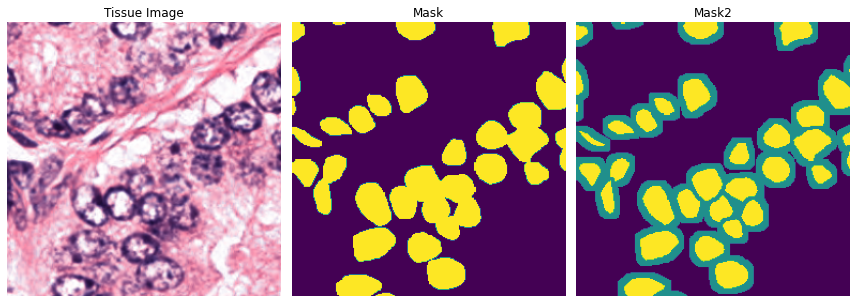

In [32]:
# sanity check
rnd = np.random.randint(len(train_images))
# rnd = 222

fig, ax = plt.subplots(1, 3, figsize=(12, 6))
[axi.set_axis_off() for axi in ax.ravel()]

ax[0].imshow(train_images[rnd])
ax[0].set_title("Tissue Image")

ax[1].imshow(train_masks[rnd])
ax[1].set_title("Mask")

# ax[2].imshow(train_images[rnd])
ax[2].imshow(train_masks2[rnd])
ax[2].set_title("Mask2")

plt.tight_layout()
plt.show()

## One-hot encoding the modified masks

In [28]:
# train masks
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

label_encoder = LabelEncoder()
n, h, w = train_masks.shape
train_masks_reshaped = train_masks2.reshape(-1,)
train_masks_reshaped_encoded = label_encoder.fit_transform(train_masks_reshaped)
train_masks_encoded_original_shape = train_masks_reshaped_encoded.reshape(n, h, w)

n_classes = 3
train_masks_cat = to_categorical(train_masks_encoded_original_shape, num_classes=n_classes)
train_masks_cat.shape

(1176, 256, 256, 3)

In [29]:
# val masks
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

label_encoder = LabelEncoder()
n, h, w = val_masks.shape
val_masks_reshaped = val_masks2.reshape(-1,)
val_masks_reshaped_encoded = label_encoder.fit_transform(val_masks_reshaped)
val_masks_encoded_original_shape = val_masks_reshaped_encoded.reshape(n, h, w)

n_classes = 3
val_masks_cat = to_categorical(val_masks_encoded_original_shape, num_classes=n_classes)
val_masks_cat.shape

(294, 256, 256, 3)

## Data augmentation using albumentations library

In [30]:
import albumentations as A
from keras.utils import Sequence

In [31]:
print(A.__version__)

1.2.1


In [33]:
class DataGenerator(Sequence):
    'Generates data for Keras'
    def __init__(self, images, masks, masks_cat, seed=42, augmentations=None, 
                 batch_size=8, img_size=256, n_channels=3, shuffle=True):
        'Initialization'
        self.batch_size = batch_size
        self.seed = seed
        # random.seed(self.seed)
        # np.random.seed(self.seed)
        
        self.images = images
        self.masks = masks
        self.masks_cat = masks_cat

        self.img_size = img_size
        
        self.n_channels = n_channels
        self.shuffle = shuffle
        self.augment = augmentations
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.ceil(len(self.images) / self.batch_size))

    def __getitem__(self, index):
        # random.seed(self.seed)
        'Generate one batch of data'
        # Generate indices of the batch
        indices = self.indices[index * self.batch_size: min((index + 1) * self.batch_size, len(self.images))]

        # Generate data
        X, y = self.data_generation(indices)
        y1 = y[0]

        if self.augment is None:
            return X, [np.array(y1)]
        else:            
            im, mask1, mask2 = [], [], []   
            for x, y1 in zip(X, y1):
                augmented = self.augment(image=x, mask1=y1)
                im.append(augmented['image'])
                mask1.append(augmented['mask1'])

            return np.array(im), [np.array(mask1)]

    def on_epoch_end(self):
        'Updates indices after each epoch'
        self.indices = np.arange(len(self.images))
        if self.shuffle == True:
            np.random.shuffle(self.indices)

    def data_generation(self, indices):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((len(indices), self.img_size, self.img_size, self.n_channels))
        y1 = np.empty((len(indices), self.img_size, self.img_size, 4))
        # y2 = np.empty((len(indices), self.img_size, self.img_size, 4)) # 3 classes (Nuclei, Border, Background)
        # Generate data
        for n, i in enumerate(indices):
            X[n] = self.images[i]
            # y1[n, :, :, 0] = self.masks[i]/255.
            # y1[n, :, :, 1] = self.masks[i]/255.
            y1[n, :, :, 0] = self.masks[i]/255.
            y1[n, :, :, 1:] = self.masks_cat[i]
            

        return np.uint8(X), [np.float32(y1)]

In [34]:
AUGMENTATIONS_TRAIN = A.Compose([
    A.Rotate(limit=360, p=0.5),
    A.OneOf([
        A.HorizontalFlip(),
        A.VerticalFlip(),
        ], p=0.5),
    A.OneOf([
        A.RandomBrightnessContrast(),
        A.RandomGamma(),
        A.GaussNoise()
         ], p=0.3),
    A.OneOf([
        A.ElasticTransform(alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03),
        A.Affine(translate_percent=0.2, shear=30, mode=cv2.BORDER_CONSTANT),
        A.GridDistortion(),
        A.OpticalDistortion(distort_limit=2, shift_limit=0.5),
        ], p=0.3),
    A.OneOf([
        A.RGBShift(r_shift_limit=20, g_shift_limit=20,  b_shift_limit=20),
        A.ColorJitter(hue=0.1),
        A.GaussianBlur(blur_limit=(3, 7), sigma_limit=0, always_apply=False)
        ], p=0.3),
    A.ToFloat(max_value=255)
], p=1,
additional_targets={'image': 'image', 'mask1': 'mask'})

AUGMENTATIONS_VAL = A.Compose([
    A.ToFloat(max_value=255)
], p=1,
additional_targets={'image': 'image', 'mask1': 'mask'})

### Testing data generator

(256, 256, 4)


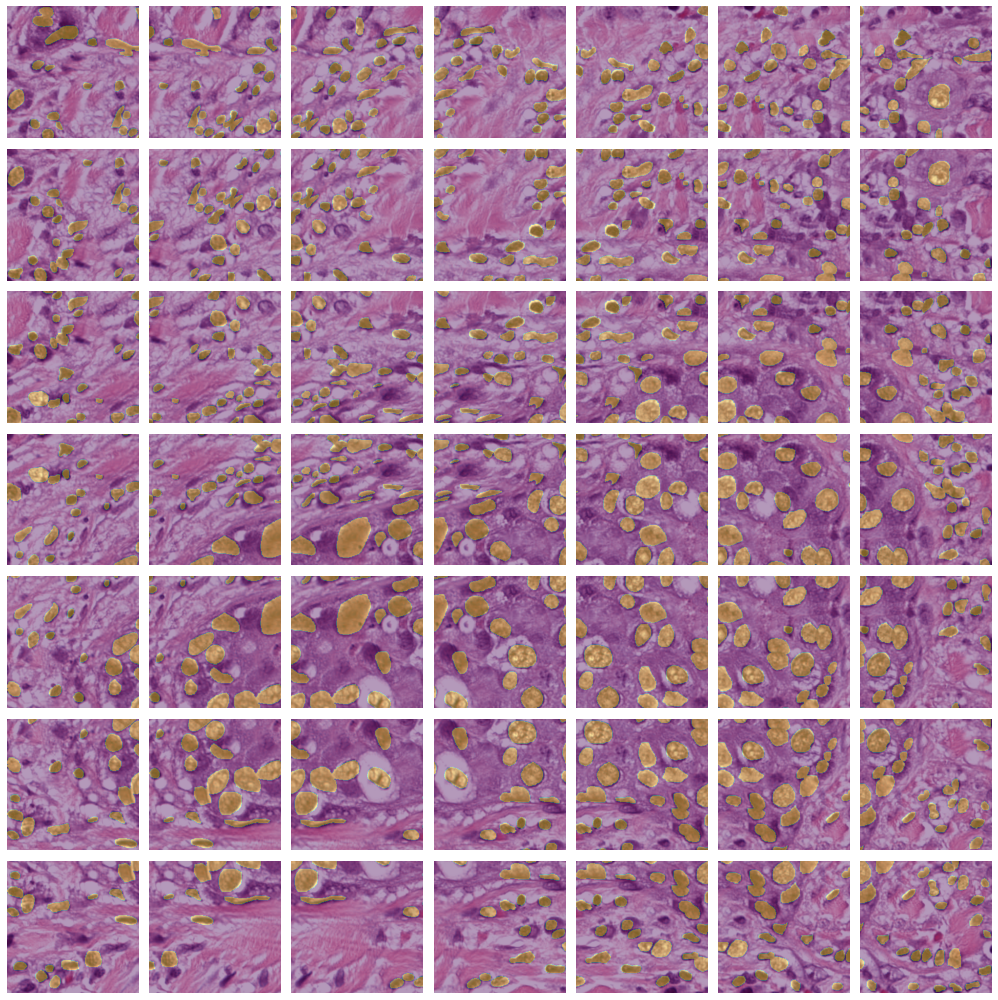

In [35]:
# Single tissue image with 256*256 tiles (50% overlap between tiles) without augmentation
a = DataGenerator(train_images, train_masks, train_masks_cat, batch_size=49, augmentations=None, shuffle=False)
images, masks = a.__getitem__(0)

max_images = 49
grid_width = 7
grid_height = int(max_images / grid_width)
fig, axs = plt.subplots(grid_height, grid_width, figsize=(grid_width*2, grid_height*2))

for i,(im, mask1) in enumerate(zip(images, masks[0])):
    ax = axs[int(i / grid_width), i % grid_width]
    ax.imshow(im)
    ax.imshow(mask1[..., 0], alpha=0.4)
    # ax.imshow(mask2[..., :3], alpha=0.4)    
    ax.axis('off')

print(mask1.shape)
plt.tight_layout()
plt.show()

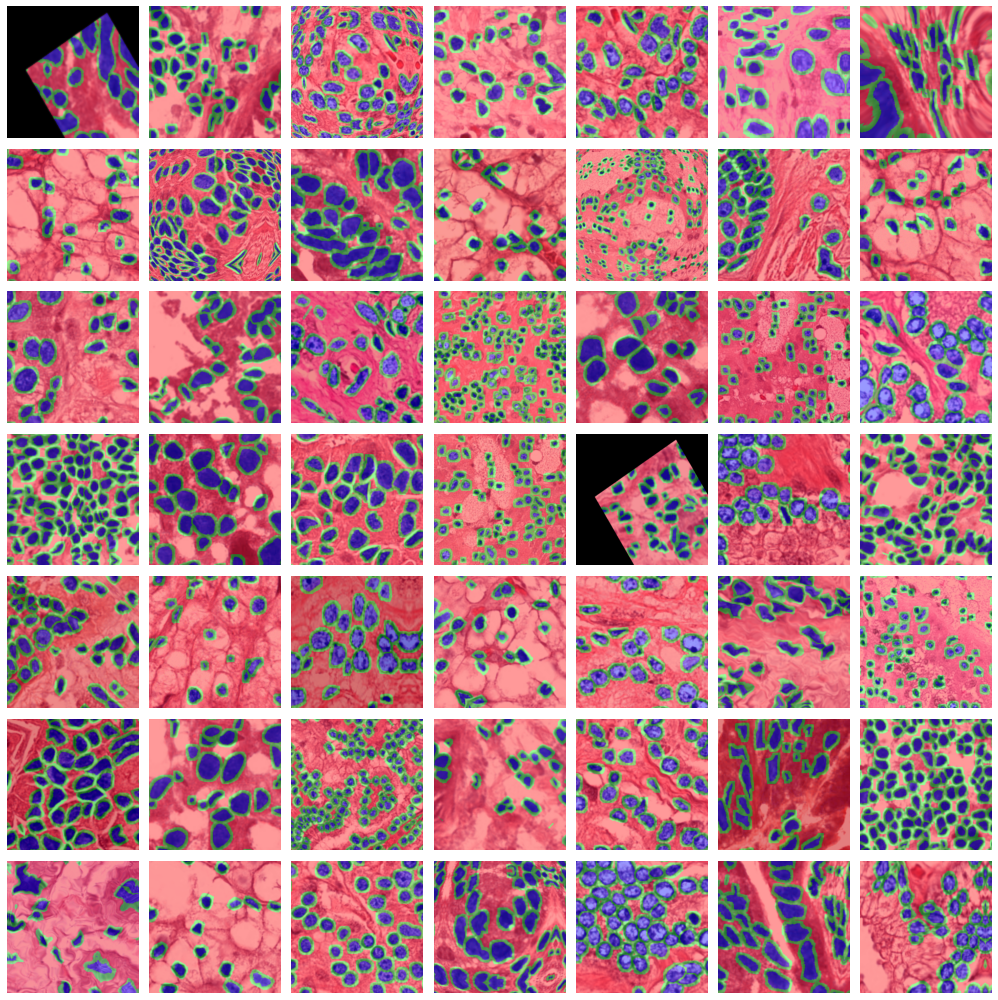

In [36]:
# Same tissue image with augmentations
a = DataGenerator(train_images, train_masks, train_masks_cat, batch_size=49, augmentations=AUGMENTATIONS_TRAIN, shuffle=True)
images, masks = a.__getitem__(0)

max_images = 49
grid_width = 7
grid_height = int(max_images / grid_width)
fig, axs = plt.subplots(grid_height, grid_width, figsize=(grid_width*2, grid_height*2))

for i,(im, mask1) in enumerate(zip(images, masks[0])):
    ax = axs[int(i / grid_width), i % grid_width]
    ax.imshow(im)
    ax.imshow(mask1[..., 1:], alpha=0.4)
    # ax.imshow(mask2[..., :3], alpha=0.4)     
    ax.axis('off')

plt.tight_layout()
plt.show()

## Defining the model

In [37]:
# import tensorflow as tf
# import keras
# print(tf.__version__)
# print(keras.__version__)

In [ ]:
# https://github.com/DebeshJha/2020-CBMS-DoubleU-Net
# https://github.com/nikhilroxtomar/Semantic-Segmentation-Architecture/blob/main/TensorFlow/doubleunet.py

import tensorflow as tf
from keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from keras.layers import GlobalAveragePooling2D, GlobalMaxPooling2D, Reshape, Dense, Multiply, AveragePooling2D, UpSampling2D
from keras.models import Model
from keras.applications import VGG19

def squeeze_excite_block(inputs, ratio=8):
    init = inputs       ## (b, 128, 128, 32)
    channel_axis = -1
    filters = init.shape[channel_axis]
    se_shape = (1, 1, filters)

    se = GlobalAveragePooling2D()(init)     ## (b, 32)   -> (b, 1, 1, 32)
    se = Reshape(se_shape)(se)
    se = Dense(filters//ratio, activation="relu", use_bias=False)(se)
    se = Dense(filters, activation="sigmoid", use_bias=False)(se)

    x = Multiply()([inputs, se])
    return x

def channel_attention_module(x, ratio=8):
    batch, _, _, channel = x.shape

    ## Shared layers
    l1 = Dense(channel//ratio, activation="relu", use_bias=False)
    l2 = Dense(channel, use_bias=False)

    ## Global Average Pooling
    x1 = GlobalAveragePooling2D()(x)
    x1 = l1(x1)
    x1 = l2(x1)

    ## Global Max Pooling
    x2 = GlobalMaxPooling2D()(x)
    x2 = l1(x2)
    x2 = l2(x2)

    ## Add both the features and pass through sigmoid
    feats = x1 + x2
    feats = Activation("sigmoid")(feats)
    feats = Multiply()([x, feats])

    return feats

def spatial_attention_module(x):
    ## Average Pooling
    x1 = tf.reduce_mean(x, axis=-1)
    x1 = tf.expand_dims(x1, axis=-1)

    ## Max Pooling
    x2 = tf.reduce_max(x, axis=-1)
    x2 = tf.expand_dims(x2, axis=-1)

    ## Concatenat both the features
    feats = Concatenate()([x1, x2])
    ## Conv layer
    feats = Conv2D(1, kernel_size=7, padding="same", activation="sigmoid")(feats)
    feats = Multiply()([x, feats])

    return feats

def cbam(x):
    x = channel_attention_module(x)
    x = spatial_attention_module(x)
    return x

def ASPP(x, filter):
    shape = x.shape

    y1 = AveragePooling2D(pool_size=(shape[1], shape[2]))(x)
    y1 = Conv2D(filter, 1, padding="same")(y1)
    y1 = BatchNormalization()(y1)
    y1 = Activation("relu")(y1)
    y1 = UpSampling2D((shape[1], shape[2]), interpolation="bilinear")(y1)

    y2 = Conv2D(filter, 1, dilation_rate=1, padding="same", use_bias=False)(x)
    y2 = BatchNormalization()(y2)
    y2 = Activation("relu")(y2)

    y3 = Conv2D(filter, 3, dilation_rate=6, padding="same", use_bias=False)(x)
    y3 = BatchNormalization()(y3)
    y3 = Activation("relu")(y3)

    y4 = Conv2D(filter, 3, dilation_rate=12, padding="same", use_bias=False)(x)
    y4 = BatchNormalization()(y4)
    y4 = Activation("relu")(y4)

    y5 = Conv2D(filter, 3, dilation_rate=18, padding="same", use_bias=False)(x)
    y5 = BatchNormalization()(y5)
    y5 = Activation("relu")(y5)

    y = Concatenate()([y1, y2, y3, y4, y5])

    y = Conv2D(filter, 1, dilation_rate=1, padding="same", use_bias=False)(y)
    y = BatchNormalization()(y)
    y = Activation("relu")(y)

    return y

def conv_block(x, filters):
    x = Conv2D(filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    # x = squeeze_excite_block(x)
    x = cbam(x)

    return x

def encoder1(inputs):
    skip_connections = []

    model = VGG19(include_top=False, weights="imagenet", input_tensor=inputs)
    names = ["block1_conv2", "block2_conv2", "block3_conv4", "block4_conv4"]
    for name in names:
        skip_connections.append(model.get_layer(name).output)

    output = model.get_layer("block5_conv4").output
    return output, skip_connections

def decoder1(inputs, skip_connections):
    num_filters = [256, 128, 64, 32]
    skip_connections.reverse()

    x = inputs
    for i, f in enumerate(num_filters):
        x = UpSampling2D((2, 2), interpolation="bilinear")(x)
        x = Concatenate()([x, skip_connections[i]])
        x = conv_block(x, f)

    return x

def output_block(inputs, num_classes, output_activation):
    x = Conv2D(num_classes, 1, padding="same")(inputs)
    x = Activation(output_activation)(x)
    return x

def encoder2(inputs):
    num_filters = [32, 64, 128, 256]
    skip_connections = []

    x = inputs
    for i, f in enumerate(num_filters):
        x = conv_block(x, f)
        skip_connections.append(x)
        x = MaxPool2D((2, 2))(x)

    return x, skip_connections

def decoder2(inputs, skip_1, skip_2):
    num_filters = [256, 128, 64, 32]
    skip_2.reverse()

    x = inputs
    for i, f in enumerate(num_filters):
        x = UpSampling2D((2, 2), interpolation="bilinear")(x)
        x = Concatenate()([x, skip_1[i], skip_2[i]])
        x = conv_block(x, f)

    return x

def build_model(input_shape):
    # first U-Net
    inputs = Input(input_shape)
    x, skip_1 = encoder1(inputs)
    x = ASPP(x, 32)
    x = decoder1(x, skip_1)
    output1 = output_block(x, num_classes=1, output_activation="sigmoid")

    # 2nd U-Net to train with binary masks
    x_1 = inputs * output1

    x_1, skip_21 = encoder2(x_1)
    x_1 = ASPP(x_1, 32)
    x_1 = decoder2(x_1, skip_1, skip_21)
    output21 = output_block(x_1, num_classes=1, output_activation="sigmoid")

    outputs_1 = Concatenate(name="Binary_segmentation")([output1, output21])

    # 3rd U-Net to train with modified masks
    x_2 = inputs * output1

    x_2, skip_22 = encoder2(x_2)
    x_2 = ASPP(x_2, 32)
    x_2 = decoder2(x_2, skip_1, skip_22)
    output22 = output_block(x_2, num_classes=3, output_activation="softmax")

    outputs_2 = Concatenate(name="MultiClass_segmentation")([output1, output22])

    model = Model(inputs, [outputs_1, outputs_2])
    return model

In [ ]:
input_shape = (256, 256, 3)
model = build_model(input_shape)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 256, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 256, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                             

### Defining loss function for binary & multi segmentation tasks

In [ ]:
import keras.backend as K
from keras.optimizers import Adam
from keras.losses import binary_crossentropy, categorical_crossentropy

In [ ]:
# https://gist.github.com/robinvvinod/60d61a3ca642ddd826cf1e6c207cb421

def dice_coef(y_true, y_pred, smooth=1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)


def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

def tversky(y_true, y_pred, smooth=1, alpha=0.7):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1 - y_pred_pos))
    false_pos = K.sum((1 - y_true_pos) * y_pred_pos)
    return (true_pos + smooth) / (true_pos + alpha * false_neg + (1 - alpha) * false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true, y_pred)

def focal_tversky_loss(y_true, y_pred, gamma=0.75):
    tv = tversky(y_true, y_pred)
    return K.pow((1 - tv), gamma)

In [ ]:
# def binary_loss(y_true, y_pred):
#     bce_loss = binary_crossentropy(y_true, y_pred)
#     ftl = focal_tversky_loss(y_true, y_pred)
#     return ftl + (0.5*bce_loss)

# def multi_loss(y_true, y_pred):
#     ce_loss = categorical_crossentropy(y_true, y_pred)
#     ftl = focal_tversky_loss(y_true, y_pred)
#     return ftl + (0.5*ce_loss)

In [ ]:
!pip install keras_unet_collection

In [ ]:
from keras_unet_collection import losses

def binary_loss(y_true, y_pred):

    loss_focal = losses.focal_tversky(y_true, y_pred, alpha=0.5, gamma=4/3)
    loss_iou = losses.iou_seg(y_true, y_pred)
    
    # (x) 
    # loss_ssim = losses.ms_ssim(y_true, y_pred, max_val=1.0, filter_size=4)
    
    return loss_focal+loss_iou #+loss_ssim

def multi_loss(y_true, y_pred):

    loss_focal = losses.focal_tversky(y_true, y_pred, alpha=0.7, gamma=4/3)
    loss_iou = losses.iou_seg(y_true, y_pred)
    
    # (x) 
    # loss_ssim = losses.ms_ssim(y_true, y_pred, max_val=1.0, filter_size=4)
    
    return loss_focal+loss_iou #+loss_ssim

### Compiling the model

In [ ]:
model.compile(optimizer=Adam(learning_rate=1e-4),
              loss={"Binary_segmentation": binary_loss, 
                    "MultiClass_segmentation": multi_loss},
              metrics={"Binary_segmentation": dice_coef, 
                       "MultiClass_segmentation": dice_coef})

## Train the model

### Defining some useful callbacks 

In [ ]:
from keras.callbacks import ModelCheckpoint, CSVLogger, ReduceLROnPlateau, EarlyStopping, Callback
import datetime

from skimage import filters
from scipy.ndimage import measurements
from skimage.segmentation import watershed, mark_boundaries

# Visualize training 
class loss_history(Callback):

    def __init__(self, x=4):
        self.x = x
    
    def on_epoch_begin(self, epoch, logs={}):
        fig, ax = plt.subplots(1, 5, figsize=(18, 12))
        [axi.set_axis_off() for axi in ax.ravel()]

        ax[0].imshow(train_images[self.x])
        ax[0].set_title("Tissue Image")

        ax[1].imshow(train_masks[self.x], cmap="gray")
        ax[1].set_title("Ground Truth")

        model_sample_input = train_images[self.x].astype("float32") / 255.
        preds_train1, preds_train2 = self.model.predict(np.expand_dims(model_sample_input, axis=0), verbose=0)
        preds1 =  np.squeeze(preds_train1[..., 1]) >= 0.5
        ax[2].imshow(preds1, cmap="gray")
        ax[2].set_title("Nuclei prediction")
        preds2 = np.squeeze(preds_train2[..., 3] - preds_train2[..., 2] >= 0.5)
        ax[3].imshow(preds2, cmap="gray")
        ax[3].set_title("Nuclei marker prediction")
        
        grad = filters.scharr(preds1)
        marker = preds1 * preds2
        marker = measurements.label(marker)[0]
        proced_pred = watershed(grad, marker, mask=preds1)
        ax[4].imshow(mark_boundaries(train_images[self.x], proced_pred, color=(0, 0, 1)))
        ax[4].set_title("Result")

        plt.tight_layout()
        plt.show()

csv_log = CSVLogger('DoubleUnet_1stfold_Adam_1e-4_log00.csv', separator=',')
model_name = f"DoubleUnet_1stfold_Adam_1e-3_v00_{datetime.datetime.now().strftime('%Y%m%d-%H%M%S')}"
create_path("models")
path_to_save_model = "models/" + model_name + ".h5"
checkpointer = ModelCheckpoint(path_to_save_model, verbose=1, save_best_only=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10, min_lr=1e-7, verbose=1)
early_stop   = EarlyStopping(monitor="val_loss", patience=20, restore_best_weights=False)

In [ ]:
callbacks = [loss_history(), 
             checkpointer, 
             reduce_lr, 
            #  csv_log, 
             early_stop]

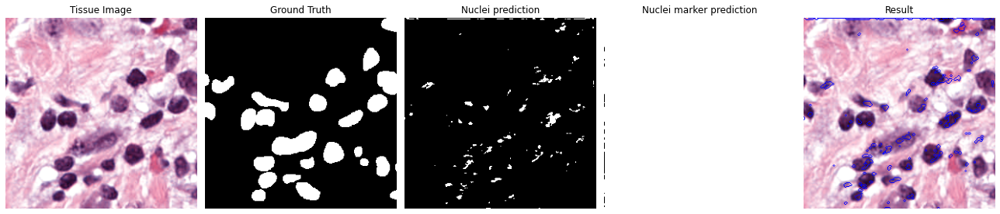

Epoch 1/200
147/147 [==============================] - ETA: 0s - loss: 1.8225 - Binary_segmentation_loss: 0.9749 - MultiClass_segmentation_loss: 0.8476 - Binary_segmentation_dice_coef: 0.6448 - MultiClass_segmentation_dice_coef: 0.6924
Epoch 1: val_loss improved from inf to 1.70400, saving model to models/DoubleUnet_1stfold_Adam_1e-3_v00_20221223-090300.h5
147/147 [==============================] - 160s 955ms/step - loss: 1.8225 - Binary_segmentation_loss: 0.9749 - MultiClass_segmentation_loss: 0.8476 - Binary_segmentation_dice_coef: 0.6448 - MultiClass_segmentation_dice_coef: 0.6924 - val_loss: 1.7040 - val_Binary_segmentation_loss: 0.8425 - val_MultiClass_segmentation_loss: 0.8615 - val_Binary_segmentation_dice_coef: 0.7106 - val_MultiClass_segmentation_dice_coef: 0.6999 - lr: 1.0000e-04


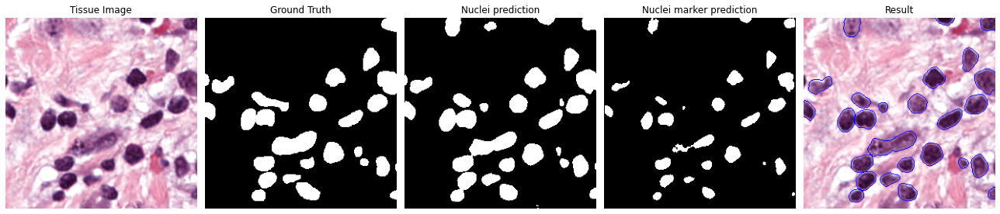

Epoch 2/200
147/147 [==============================] - ETA: 0s - loss: 1.4721 - Binary_segmentation_loss: 0.8089 - MultiClass_segmentation_loss: 0.6632 - Binary_segmentation_dice_coef: 0.7250 - MultiClass_segmentation_dice_coef: 0.7785
Epoch 2: val_loss improved from 1.70400 to 1.50646, saving model to models/DoubleUnet_1stfold_Adam_1e-3_v00_20221223-090300.h5
147/147 [==============================] - 140s 952ms/step - loss: 1.4721 - Binary_segmentation_loss: 0.8089 - MultiClass_segmentation_loss: 0.6632 - Binary_segmentation_dice_coef: 0.7250 - MultiClass_segmentation_dice_coef: 0.7785 - val_loss: 1.5065 - val_Binary_segmentation_loss: 0.7836 - val_MultiClass_segmentation_loss: 0.7229 - val_Binary_segmentation_dice_coef: 0.7366 - val_MultiClass_segmentation_dice_coef: 0.7565 - lr: 1.0000e-04


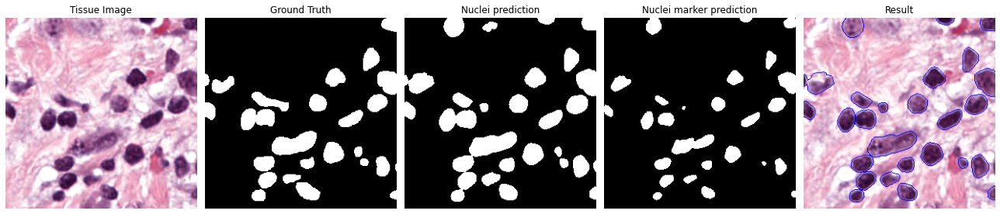

Epoch 3/200
147/147 [==============================] - ETA: 0s - loss: 1.3754 - Binary_segmentation_loss: 0.7554 - MultiClass_segmentation_loss: 0.6200 - Binary_segmentation_dice_coef: 0.7485 - MultiClass_segmentation_dice_coef: 0.7970
Epoch 3: val_loss improved from 1.50646 to 1.46680, saving model to models/DoubleUnet_1stfold_Adam_1e-3_v00_20221223-090300.h5
147/147 [==============================] - 140s 954ms/step - loss: 1.3754 - Binary_segmentation_loss: 0.7554 - MultiClass_segmentation_loss: 0.6200 - Binary_segmentation_dice_coef: 0.7485 - MultiClass_segmentation_dice_coef: 0.7970 - val_loss: 1.4668 - val_Binary_segmentation_loss: 0.7412 - val_MultiClass_segmentation_loss: 0.7256 - val_Binary_segmentation_dice_coef: 0.7547 - val_MultiClass_segmentation_dice_coef: 0.7588 - lr: 1.0000e-04


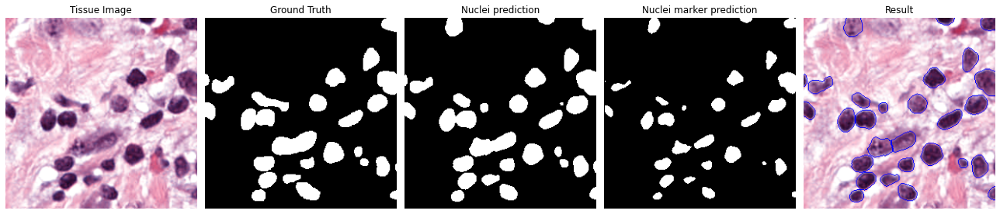

Epoch 4/200
147/147 [==============================] - ETA: 0s - loss: 1.3203 - Binary_segmentation_loss: 0.7229 - MultiClass_segmentation_loss: 0.5974 - Binary_segmentation_dice_coef: 0.7622 - MultiClass_segmentation_dice_coef: 0.8064
Epoch 4: val_loss improved from 1.46680 to 1.33665, saving model to models/DoubleUnet_1stfold_Adam_1e-3_v00_20221223-090300.h5
147/147 [==============================] - 140s 952ms/step - loss: 1.3203 - Binary_segmentation_loss: 0.7229 - MultiClass_segmentation_loss: 0.5974 - Binary_segmentation_dice_coef: 0.7622 - MultiClass_segmentation_dice_coef: 0.8064 - val_loss: 1.3367 - val_Binary_segmentation_loss: 0.6799 - val_MultiClass_segmentation_loss: 0.6568 - val_Binary_segmentation_dice_coef: 0.7802 - val_MultiClass_segmentation_dice_coef: 0.7871 - lr: 1.0000e-04


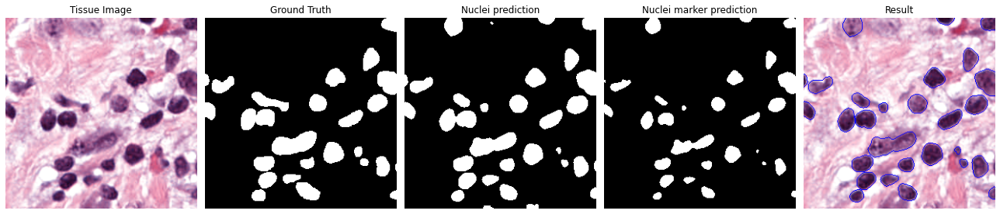

Epoch 5/200
147/147 [==============================] - ETA: 0s - loss: 1.2632 - Binary_segmentation_loss: 0.6886 - MultiClass_segmentation_loss: 0.5747 - Binary_segmentation_dice_coef: 0.7766 - MultiClass_segmentation_dice_coef: 0.8161
Epoch 5: val_loss did not improve from 1.33665
147/147 [==============================] - 136s 925ms/step - loss: 1.2632 - Binary_segmentation_loss: 0.6886 - MultiClass_segmentation_loss: 0.5747 - Binary_segmentation_dice_coef: 0.7766 - MultiClass_segmentation_dice_coef: 0.8161 - val_loss: 1.4073 - val_Binary_segmentation_loss: 0.6996 - val_MultiClass_segmentation_loss: 0.7077 - val_Binary_segmentation_dice_coef: 0.7725 - val_MultiClass_segmentation_dice_coef: 0.7693 - lr: 1.0000e-04


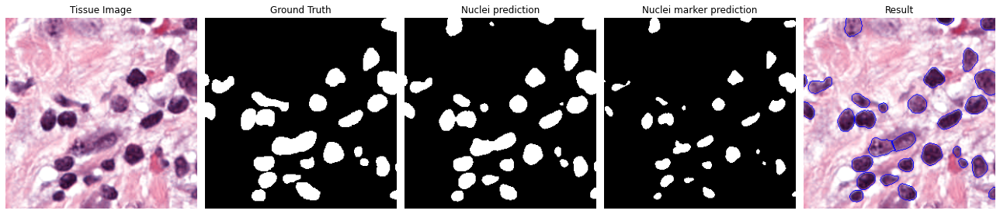

Epoch 6/200
147/147 [==============================] - ETA: 0s - loss: 1.2273 - Binary_segmentation_loss: 0.6636 - MultiClass_segmentation_loss: 0.5638 - Binary_segmentation_dice_coef: 0.7869 - MultiClass_segmentation_dice_coef: 0.8206
Epoch 6: val_loss improved from 1.33665 to 1.31744, saving model to models/DoubleUnet_1stfold_Adam_1e-3_v00_20221223-090300.h5
147/147 [==============================] - 141s 960ms/step - loss: 1.2273 - Binary_segmentation_loss: 0.6636 - MultiClass_segmentation_loss: 0.5638 - Binary_segmentation_dice_coef: 0.7869 - MultiClass_segmentation_dice_coef: 0.8206 - val_loss: 1.3174 - val_Binary_segmentation_loss: 0.6603 - val_MultiClass_segmentation_loss: 0.6572 - val_Binary_segmentation_dice_coef: 0.7880 - val_MultiClass_segmentation_dice_coef: 0.7883 - lr: 1.0000e-04


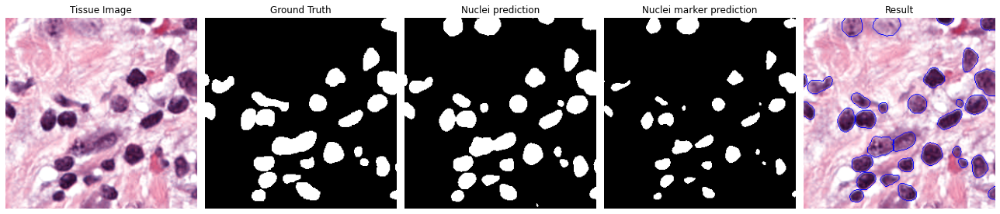

Epoch 7/200
147/147 [==============================] - ETA: 0s - loss: 1.1896 - Binary_segmentation_loss: 0.6401 - MultiClass_segmentation_loss: 0.5495 - Binary_segmentation_dice_coef: 0.7965 - MultiClass_segmentation_dice_coef: 0.8266
Epoch 7: val_loss did not improve from 1.31744
147/147 [==============================] - 136s 927ms/step - loss: 1.1896 - Binary_segmentation_loss: 0.6401 - MultiClass_segmentation_loss: 0.5495 - Binary_segmentation_dice_coef: 0.7965 - MultiClass_segmentation_dice_coef: 0.8266 - val_loss: 1.3380 - val_Binary_segmentation_loss: 0.6677 - val_MultiClass_segmentation_loss: 0.6704 - val_Binary_segmentation_dice_coef: 0.7856 - val_MultiClass_segmentation_dice_coef: 0.7850 - lr: 1.0000e-04


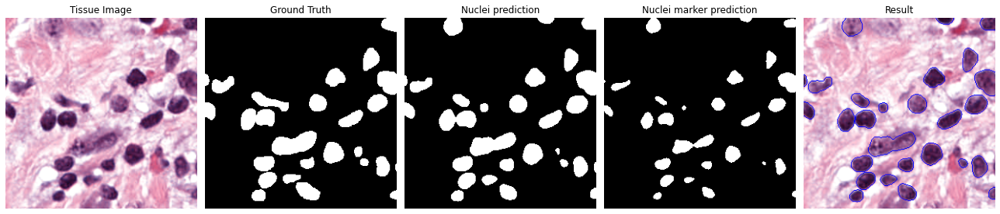

Epoch 8/200
147/147 [==============================] - ETA: 0s - loss: 1.1684 - Binary_segmentation_loss: 0.6269 - MultiClass_segmentation_loss: 0.5415 - Binary_segmentation_dice_coef: 0.8017 - MultiClass_segmentation_dice_coef: 0.8298
Epoch 8: val_loss improved from 1.31744 to 1.26389, saving model to models/DoubleUnet_1stfold_Adam_1e-3_v00_20221223-090300.h5
147/147 [==============================] - 140s 953ms/step - loss: 1.1684 - Binary_segmentation_loss: 0.6269 - MultiClass_segmentation_loss: 0.5415 - Binary_segmentation_dice_coef: 0.8017 - MultiClass_segmentation_dice_coef: 0.8298 - val_loss: 1.2639 - val_Binary_segmentation_loss: 0.6257 - val_MultiClass_segmentation_loss: 0.6382 - val_Binary_segmentation_dice_coef: 0.8023 - val_MultiClass_segmentation_dice_coef: 0.7962 - lr: 1.0000e-04


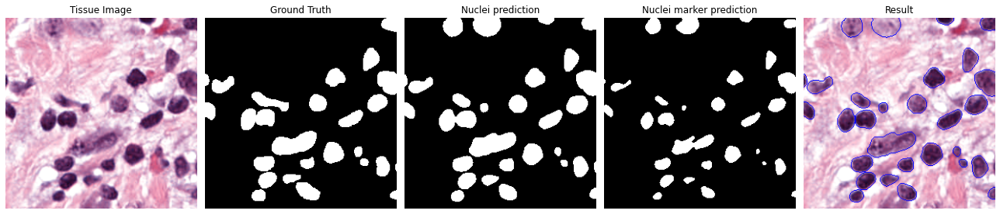

Epoch 9/200
147/147 [==============================] - ETA: 0s - loss: 1.1427 - Binary_segmentation_loss: 0.6119 - MultiClass_segmentation_loss: 0.5309 - Binary_segmentation_dice_coef: 0.8078 - MultiClass_segmentation_dice_coef: 0.8342
Epoch 9: val_loss did not improve from 1.26389
147/147 [==============================] - 136s 928ms/step - loss: 1.1427 - Binary_segmentation_loss: 0.6119 - MultiClass_segmentation_loss: 0.5309 - Binary_segmentation_dice_coef: 0.8078 - MultiClass_segmentation_dice_coef: 0.8342 - val_loss: 1.3516 - val_Binary_segmentation_loss: 0.6788 - val_MultiClass_segmentation_loss: 0.6729 - val_Binary_segmentation_dice_coef: 0.7809 - val_MultiClass_segmentation_dice_coef: 0.7853 - lr: 1.0000e-04


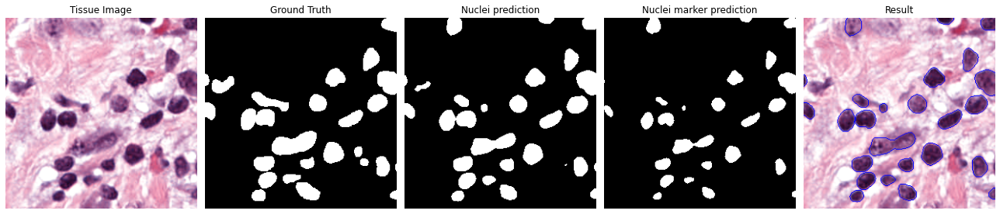

Epoch 10/200
147/147 [==============================] - ETA: 0s - loss: 1.1277 - Binary_segmentation_loss: 0.6006 - MultiClass_segmentation_loss: 0.5271 - Binary_segmentation_dice_coef: 0.8121 - MultiClass_segmentation_dice_coef: 0.8357
Epoch 10: val_loss did not improve from 1.26389
147/147 [==============================] - 136s 926ms/step - loss: 1.1277 - Binary_segmentation_loss: 0.6006 - MultiClass_segmentation_loss: 0.5271 - Binary_segmentation_dice_coef: 0.8121 - MultiClass_segmentation_dice_coef: 0.8357 - val_loss: 1.2936 - val_Binary_segmentation_loss: 0.6429 - val_MultiClass_segmentation_loss: 0.6508 - val_Binary_segmentation_dice_coef: 0.7955 - val_MultiClass_segmentation_dice_coef: 0.7928 - lr: 1.0000e-04


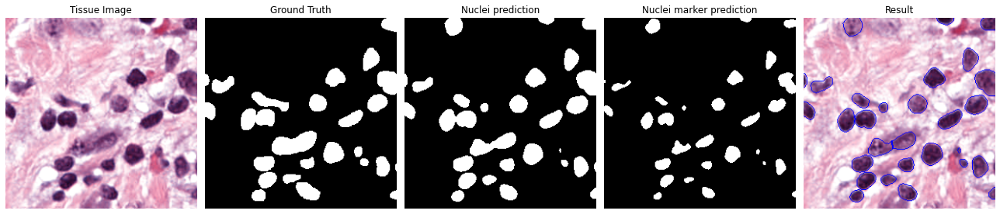

Epoch 11/200
147/147 [==============================] - ETA: 0s - loss: 1.1036 - Binary_segmentation_loss: 0.5848 - MultiClass_segmentation_loss: 0.5188 - Binary_segmentation_dice_coef: 0.8183 - MultiClass_segmentation_dice_coef: 0.8391
Epoch 11: val_loss did not improve from 1.26389
147/147 [==============================] - 136s 926ms/step - loss: 1.1036 - Binary_segmentation_loss: 0.5848 - MultiClass_segmentation_loss: 0.5188 - Binary_segmentation_dice_coef: 0.8183 - MultiClass_segmentation_dice_coef: 0.8391 - val_loss: 1.3660 - val_Binary_segmentation_loss: 0.6838 - val_MultiClass_segmentation_loss: 0.6822 - val_Binary_segmentation_dice_coef: 0.7791 - val_MultiClass_segmentation_dice_coef: 0.7809 - lr: 1.0000e-04


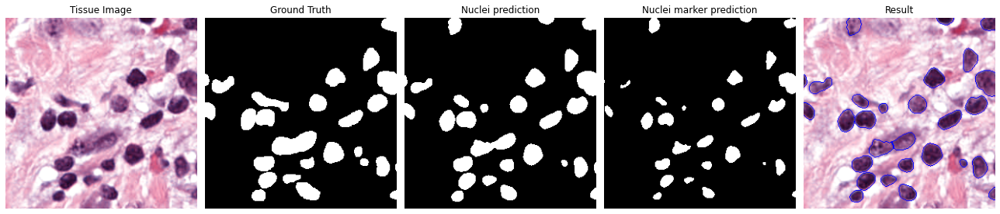

Epoch 12/200
147/147 [==============================] - ETA: 0s - loss: 1.0915 - Binary_segmentation_loss: 0.5766 - MultiClass_segmentation_loss: 0.5149 - Binary_segmentation_dice_coef: 0.8215 - MultiClass_segmentation_dice_coef: 0.8406
Epoch 12: val_loss improved from 1.26389 to 1.24286, saving model to models/DoubleUnet_1stfold_Adam_1e-3_v00_20221223-090300.h5
147/147 [==============================] - 141s 959ms/step - loss: 1.0915 - Binary_segmentation_loss: 0.5766 - MultiClass_segmentation_loss: 0.5149 - Binary_segmentation_dice_coef: 0.8215 - MultiClass_segmentation_dice_coef: 0.8406 - val_loss: 1.2429 - val_Binary_segmentation_loss: 0.6177 - val_MultiClass_segmentation_loss: 0.6252 - val_Binary_segmentation_dice_coef: 0.8057 - val_MultiClass_segmentation_dice_coef: 0.8023 - lr: 1.0000e-04


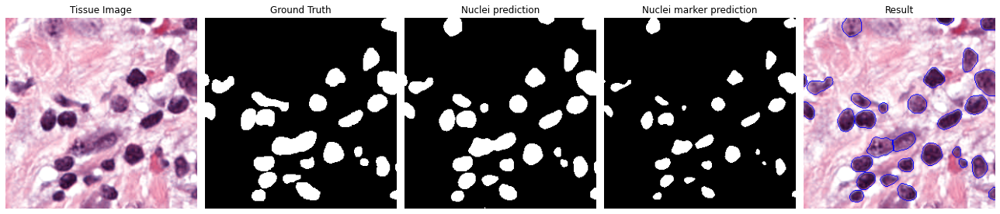

Epoch 13/200
147/147 [==============================] - ETA: 0s - loss: 1.0886 - Binary_segmentation_loss: 0.5762 - MultiClass_segmentation_loss: 0.5124 - Binary_segmentation_dice_coef: 0.8216 - MultiClass_segmentation_dice_coef: 0.8421
Epoch 13: val_loss did not improve from 1.24286
147/147 [==============================] - 137s 929ms/step - loss: 1.0886 - Binary_segmentation_loss: 0.5762 - MultiClass_segmentation_loss: 0.5124 - Binary_segmentation_dice_coef: 0.8216 - MultiClass_segmentation_dice_coef: 0.8421 - val_loss: 1.2561 - val_Binary_segmentation_loss: 0.6208 - val_MultiClass_segmentation_loss: 0.6353 - val_Binary_segmentation_dice_coef: 0.8045 - val_MultiClass_segmentation_dice_coef: 0.7990 - lr: 1.0000e-04


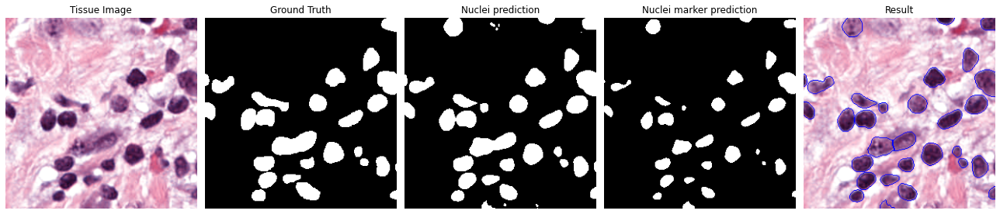

Epoch 14/200
147/147 [==============================] - ETA: 0s - loss: 1.0682 - Binary_segmentation_loss: 0.5624 - MultiClass_segmentation_loss: 0.5058 - Binary_segmentation_dice_coef: 0.8270 - MultiClass_segmentation_dice_coef: 0.8444
Epoch 14: val_loss did not improve from 1.24286
147/147 [==============================] - 136s 927ms/step - loss: 1.0682 - Binary_segmentation_loss: 0.5624 - MultiClass_segmentation_loss: 0.5058 - Binary_segmentation_dice_coef: 0.8270 - MultiClass_segmentation_dice_coef: 0.8444 - val_loss: 1.2560 - val_Binary_segmentation_loss: 0.6223 - val_MultiClass_segmentation_loss: 0.6337 - val_Binary_segmentation_dice_coef: 0.8037 - val_MultiClass_segmentation_dice_coef: 0.8000 - lr: 1.0000e-04


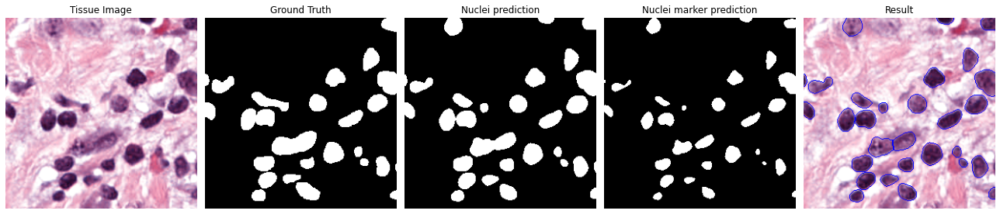

Epoch 15/200
147/147 [==============================] - ETA: 0s - loss: 1.0587 - Binary_segmentation_loss: 0.5543 - MultiClass_segmentation_loss: 0.5044 - Binary_segmentation_dice_coef: 0.8301 - MultiClass_segmentation_dice_coef: 0.8447
Epoch 15: val_loss improved from 1.24286 to 1.22628, saving model to models/DoubleUnet_1stfold_Adam_1e-3_v00_20221223-090300.h5
147/147 [==============================] - 140s 953ms/step - loss: 1.0587 - Binary_segmentation_loss: 0.5543 - MultiClass_segmentation_loss: 0.5044 - Binary_segmentation_dice_coef: 0.8301 - MultiClass_segmentation_dice_coef: 0.8447 - val_loss: 1.2263 - val_Binary_segmentation_loss: 0.6053 - val_MultiClass_segmentation_loss: 0.6210 - val_Binary_segmentation_dice_coef: 0.8107 - val_MultiClass_segmentation_dice_coef: 0.8041 - lr: 1.0000e-04


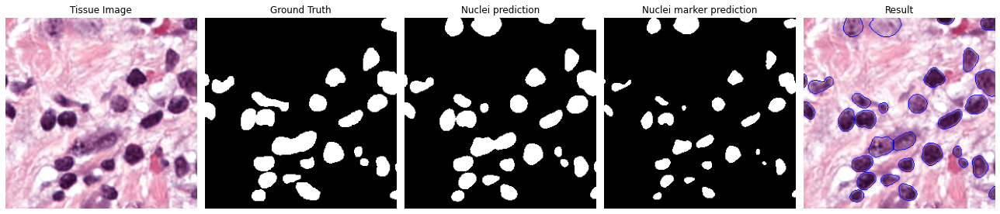

Epoch 16/200
147/147 [==============================] - ETA: 0s - loss: 1.0581 - Binary_segmentation_loss: 0.5545 - MultiClass_segmentation_loss: 0.5036 - Binary_segmentation_dice_coef: 0.8299 - MultiClass_segmentation_dice_coef: 0.8454
Epoch 16: val_loss did not improve from 1.22628
147/147 [==============================] - 136s 925ms/step - loss: 1.0581 - Binary_segmentation_loss: 0.5545 - MultiClass_segmentation_loss: 0.5036 - Binary_segmentation_dice_coef: 0.8299 - MultiClass_segmentation_dice_coef: 0.8454 - val_loss: 1.2497 - val_Binary_segmentation_loss: 0.6165 - val_MultiClass_segmentation_loss: 0.6332 - val_Binary_segmentation_dice_coef: 0.8059 - val_MultiClass_segmentation_dice_coef: 0.8001 - lr: 1.0000e-04


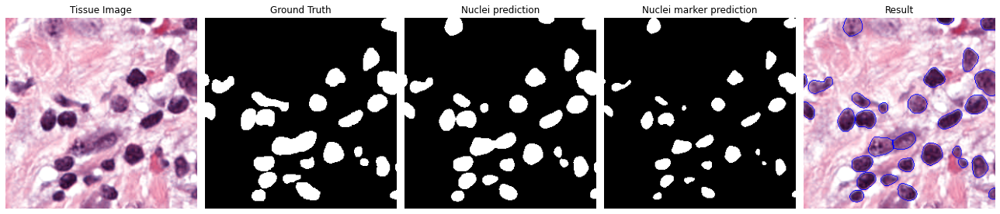

Epoch 17/200
147/147 [==============================] - ETA: 0s - loss: 1.0565 - Binary_segmentation_loss: 0.5507 - MultiClass_segmentation_loss: 0.5058 - Binary_segmentation_dice_coef: 0.8314 - MultiClass_segmentation_dice_coef: 0.8442
Epoch 17: val_loss did not improve from 1.22628
147/147 [==============================] - 136s 926ms/step - loss: 1.0565 - Binary_segmentation_loss: 0.5507 - MultiClass_segmentation_loss: 0.5058 - Binary_segmentation_dice_coef: 0.8314 - MultiClass_segmentation_dice_coef: 0.8442 - val_loss: 1.2624 - val_Binary_segmentation_loss: 0.6153 - val_MultiClass_segmentation_loss: 0.6471 - val_Binary_segmentation_dice_coef: 0.8064 - val_MultiClass_segmentation_dice_coef: 0.7942 - lr: 1.0000e-04


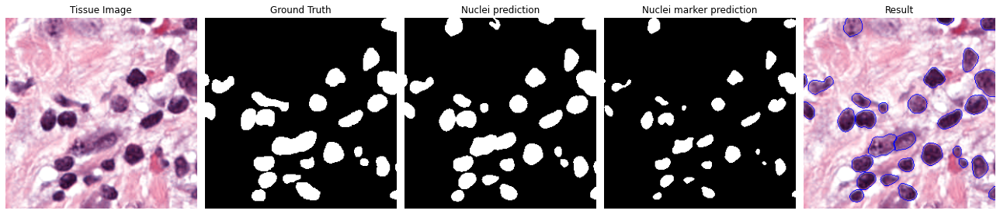

Epoch 18/200
147/147 [==============================] - ETA: 0s - loss: 1.0378 - Binary_segmentation_loss: 0.5434 - MultiClass_segmentation_loss: 0.4945 - Binary_segmentation_dice_coef: 0.8343 - MultiClass_segmentation_dice_coef: 0.8491
Epoch 18: val_loss improved from 1.22628 to 1.22175, saving model to models/DoubleUnet_1stfold_Adam_1e-3_v00_20221223-090300.h5
147/147 [==============================] - 140s 955ms/step - loss: 1.0378 - Binary_segmentation_loss: 0.5434 - MultiClass_segmentation_loss: 0.4945 - Binary_segmentation_dice_coef: 0.8343 - MultiClass_segmentation_dice_coef: 0.8491 - val_loss: 1.2218 - val_Binary_segmentation_loss: 0.5998 - val_MultiClass_segmentation_loss: 0.6220 - val_Binary_segmentation_dice_coef: 0.8129 - val_MultiClass_segmentation_dice_coef: 0.8046 - lr: 1.0000e-04


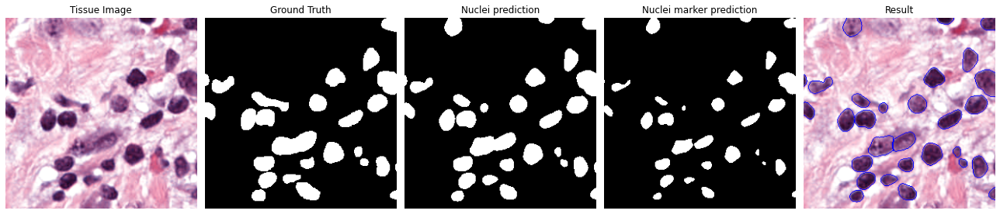

Epoch 19/200
147/147 [==============================] - ETA: 0s - loss: 1.0416 - Binary_segmentation_loss: 0.5420 - MultiClass_segmentation_loss: 0.4996 - Binary_segmentation_dice_coef: 0.8348 - MultiClass_segmentation_dice_coef: 0.8468
Epoch 19: val_loss improved from 1.22175 to 1.20926, saving model to models/DoubleUnet_1stfold_Adam_1e-3_v00_20221223-090300.h5
147/147 [==============================] - 141s 957ms/step - loss: 1.0416 - Binary_segmentation_loss: 0.5420 - MultiClass_segmentation_loss: 0.4996 - Binary_segmentation_dice_coef: 0.8348 - MultiClass_segmentation_dice_coef: 0.8468 - val_loss: 1.2093 - val_Binary_segmentation_loss: 0.5908 - val_MultiClass_segmentation_loss: 0.6185 - val_Binary_segmentation_dice_coef: 0.8163 - val_MultiClass_segmentation_dice_coef: 0.8060 - lr: 1.0000e-04


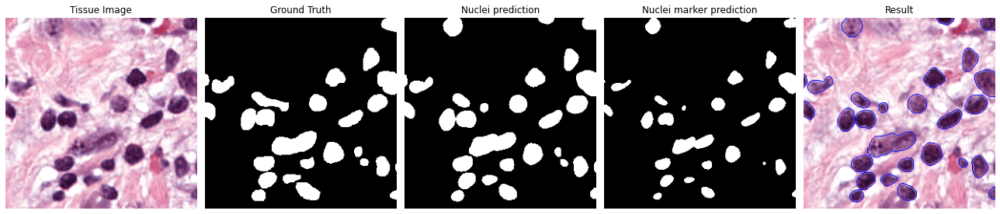

Epoch 20/200
147/147 [==============================] - ETA: 0s - loss: 1.0290 - Binary_segmentation_loss: 0.5368 - MultiClass_segmentation_loss: 0.4922 - Binary_segmentation_dice_coef: 0.8367 - MultiClass_segmentation_dice_coef: 0.8500
Epoch 20: val_loss did not improve from 1.20926
147/147 [==============================] - 136s 927ms/step - loss: 1.0290 - Binary_segmentation_loss: 0.5368 - MultiClass_segmentation_loss: 0.4922 - Binary_segmentation_dice_coef: 0.8367 - MultiClass_segmentation_dice_coef: 0.8500 - val_loss: 1.2606 - val_Binary_segmentation_loss: 0.6227 - val_MultiClass_segmentation_loss: 0.6378 - val_Binary_segmentation_dice_coef: 0.8032 - val_MultiClass_segmentation_dice_coef: 0.7990 - lr: 1.0000e-04


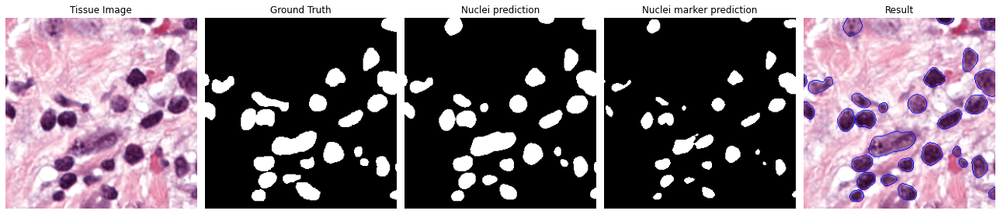

Epoch 21/200
147/147 [==============================] - ETA: 0s - loss: 1.0287 - Binary_segmentation_loss: 0.5343 - MultiClass_segmentation_loss: 0.4944 - Binary_segmentation_dice_coef: 0.8377 - MultiClass_segmentation_dice_coef: 0.8488
Epoch 21: val_loss improved from 1.20926 to 1.19342, saving model to models/DoubleUnet_1stfold_Adam_1e-3_v00_20221223-090300.h5
147/147 [==============================] - 141s 959ms/step - loss: 1.0287 - Binary_segmentation_loss: 0.5343 - MultiClass_segmentation_loss: 0.4944 - Binary_segmentation_dice_coef: 0.8377 - MultiClass_segmentation_dice_coef: 0.8488 - val_loss: 1.1934 - val_Binary_segmentation_loss: 0.5858 - val_MultiClass_segmentation_loss: 0.6076 - val_Binary_segmentation_dice_coef: 0.8179 - val_MultiClass_segmentation_dice_coef: 0.8099 - lr: 1.0000e-04


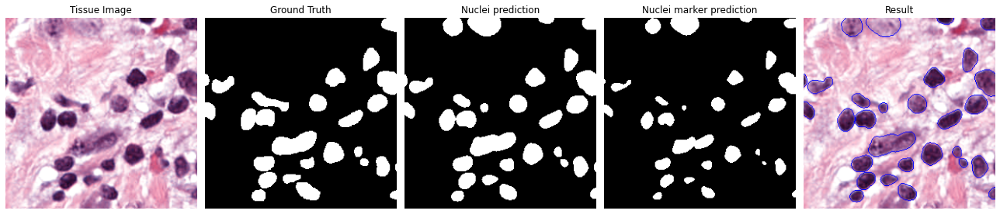

Epoch 22/200
147/147 [==============================] - ETA: 0s - loss: 1.0178 - Binary_segmentation_loss: 0.5261 - MultiClass_segmentation_loss: 0.4917 - Binary_segmentation_dice_coef: 0.8408 - MultiClass_segmentation_dice_coef: 0.8495
Epoch 22: val_loss did not improve from 1.19342
147/147 [==============================] - 136s 925ms/step - loss: 1.0178 - Binary_segmentation_loss: 0.5261 - MultiClass_segmentation_loss: 0.4917 - Binary_segmentation_dice_coef: 0.8408 - MultiClass_segmentation_dice_coef: 0.8495 - val_loss: 1.2396 - val_Binary_segmentation_loss: 0.6057 - val_MultiClass_segmentation_loss: 0.6339 - val_Binary_segmentation_dice_coef: 0.8105 - val_MultiClass_segmentation_dice_coef: 0.8003 - lr: 1.0000e-04


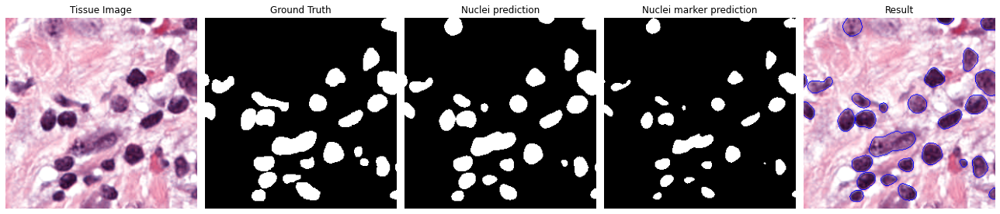

Epoch 23/200
147/147 [==============================] - ETA: 0s - loss: 1.0269 - Binary_segmentation_loss: 0.5334 - MultiClass_segmentation_loss: 0.4935 - Binary_segmentation_dice_coef: 0.8380 - MultiClass_segmentation_dice_coef: 0.8493
Epoch 23: val_loss did not improve from 1.19342
147/147 [==============================] - 136s 926ms/step - loss: 1.0269 - Binary_segmentation_loss: 0.5334 - MultiClass_segmentation_loss: 0.4935 - Binary_segmentation_dice_coef: 0.8380 - MultiClass_segmentation_dice_coef: 0.8493 - val_loss: 1.2168 - val_Binary_segmentation_loss: 0.5993 - val_MultiClass_segmentation_loss: 0.6175 - val_Binary_segmentation_dice_coef: 0.8128 - val_MultiClass_segmentation_dice_coef: 0.8063 - lr: 1.0000e-04


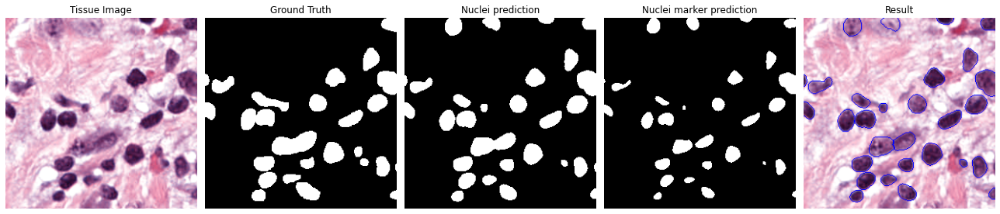

Epoch 24/200
147/147 [==============================] - ETA: 0s - loss: 1.0072 - Binary_segmentation_loss: 0.5252 - MultiClass_segmentation_loss: 0.4820 - Binary_segmentation_dice_coef: 0.8411 - MultiClass_segmentation_dice_coef: 0.8540
Epoch 24: val_loss did not improve from 1.19342
147/147 [==============================] - 136s 925ms/step - loss: 1.0072 - Binary_segmentation_loss: 0.5252 - MultiClass_segmentation_loss: 0.4820 - Binary_segmentation_dice_coef: 0.8411 - MultiClass_segmentation_dice_coef: 0.8540 - val_loss: 1.2193 - val_Binary_segmentation_loss: 0.5937 - val_MultiClass_segmentation_loss: 0.6256 - val_Binary_segmentation_dice_coef: 0.8151 - val_MultiClass_segmentation_dice_coef: 0.8035 - lr: 1.0000e-04


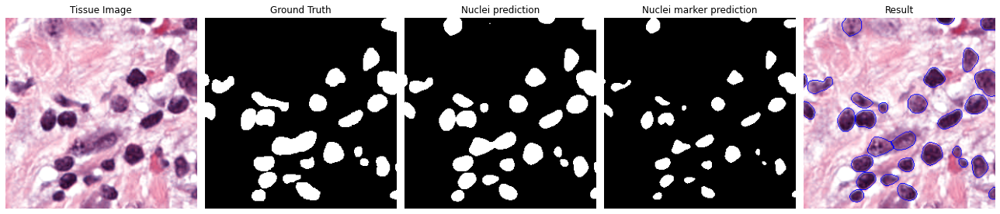

Epoch 25/200
147/147 [==============================] - ETA: 0s - loss: 1.0106 - Binary_segmentation_loss: 0.5231 - MultiClass_segmentation_loss: 0.4875 - Binary_segmentation_dice_coef: 0.8419 - MultiClass_segmentation_dice_coef: 0.8515
Epoch 25: val_loss did not improve from 1.19342
147/147 [==============================] - 136s 927ms/step - loss: 1.0106 - Binary_segmentation_loss: 0.5231 - MultiClass_segmentation_loss: 0.4875 - Binary_segmentation_dice_coef: 0.8419 - MultiClass_segmentation_dice_coef: 0.8515 - val_loss: 1.2423 - val_Binary_segmentation_loss: 0.6092 - val_MultiClass_segmentation_loss: 0.6330 - val_Binary_segmentation_dice_coef: 0.8089 - val_MultiClass_segmentation_dice_coef: 0.8011 - lr: 1.0000e-04


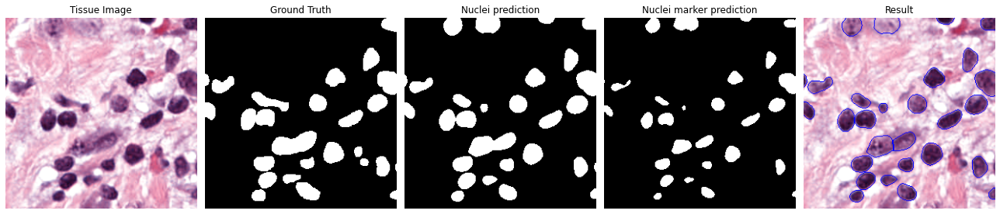

Epoch 26/200
147/147 [==============================] - ETA: 0s - loss: 1.0084 - Binary_segmentation_loss: 0.5212 - MultiClass_segmentation_loss: 0.4873 - Binary_segmentation_dice_coef: 0.8426 - MultiClass_segmentation_dice_coef: 0.8515
Epoch 26: val_loss improved from 1.19342 to 1.17721, saving model to models/DoubleUnet_1stfold_Adam_1e-3_v00_20221223-090300.h5
147/147 [==============================] - 141s 956ms/step - loss: 1.0084 - Binary_segmentation_loss: 0.5212 - MultiClass_segmentation_loss: 0.4873 - Binary_segmentation_dice_coef: 0.8426 - MultiClass_segmentation_dice_coef: 0.8515 - val_loss: 1.1772 - val_Binary_segmentation_loss: 0.5753 - val_MultiClass_segmentation_loss: 0.6020 - val_Binary_segmentation_dice_coef: 0.8221 - val_MultiClass_segmentation_dice_coef: 0.8120 - lr: 1.0000e-04


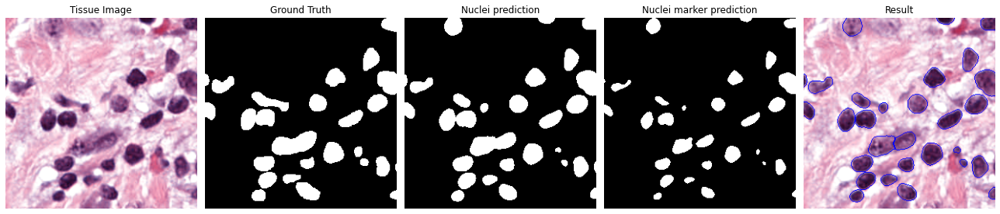

Epoch 27/200
147/147 [==============================] - ETA: 0s - loss: 1.0075 - Binary_segmentation_loss: 0.5214 - MultiClass_segmentation_loss: 0.4861 - Binary_segmentation_dice_coef: 0.8426 - MultiClass_segmentation_dice_coef: 0.8522
Epoch 27: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 927ms/step - loss: 1.0075 - Binary_segmentation_loss: 0.5214 - MultiClass_segmentation_loss: 0.4861 - Binary_segmentation_dice_coef: 0.8426 - MultiClass_segmentation_dice_coef: 0.8522 - val_loss: 1.1936 - val_Binary_segmentation_loss: 0.5857 - val_MultiClass_segmentation_loss: 0.6078 - val_Binary_segmentation_dice_coef: 0.8180 - val_MultiClass_segmentation_dice_coef: 0.8099 - lr: 1.0000e-04


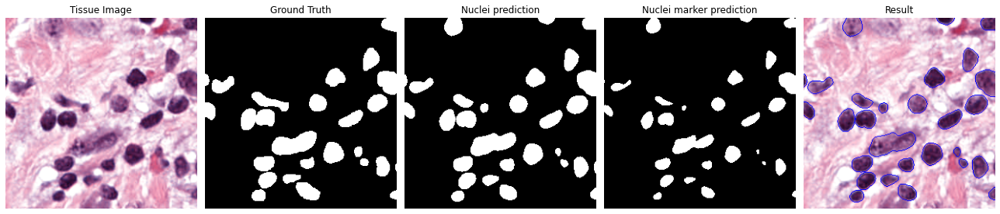

Epoch 28/200
147/147 [==============================] - ETA: 0s - loss: 0.9877 - Binary_segmentation_loss: 0.5123 - MultiClass_segmentation_loss: 0.4754 - Binary_segmentation_dice_coef: 0.8459 - MultiClass_segmentation_dice_coef: 0.8563
Epoch 28: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 925ms/step - loss: 0.9877 - Binary_segmentation_loss: 0.5123 - MultiClass_segmentation_loss: 0.4754 - Binary_segmentation_dice_coef: 0.8459 - MultiClass_segmentation_dice_coef: 0.8563 - val_loss: 1.3183 - val_Binary_segmentation_loss: 0.6483 - val_MultiClass_segmentation_loss: 0.6701 - val_Binary_segmentation_dice_coef: 0.7931 - val_MultiClass_segmentation_dice_coef: 0.7871 - lr: 1.0000e-04


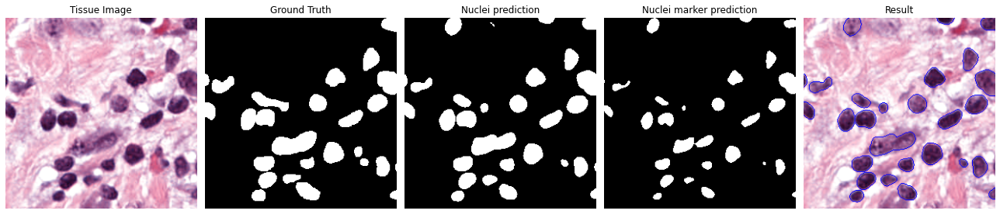

Epoch 29/200
147/147 [==============================] - ETA: 0s - loss: 0.9979 - Binary_segmentation_loss: 0.5150 - MultiClass_segmentation_loss: 0.4830 - Binary_segmentation_dice_coef: 0.8449 - MultiClass_segmentation_dice_coef: 0.8533
Epoch 29: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 925ms/step - loss: 0.9979 - Binary_segmentation_loss: 0.5150 - MultiClass_segmentation_loss: 0.4830 - Binary_segmentation_dice_coef: 0.8449 - MultiClass_segmentation_dice_coef: 0.8533 - val_loss: 1.2262 - val_Binary_segmentation_loss: 0.6014 - val_MultiClass_segmentation_loss: 0.6248 - val_Binary_segmentation_dice_coef: 0.8118 - val_MultiClass_segmentation_dice_coef: 0.8033 - lr: 1.0000e-04


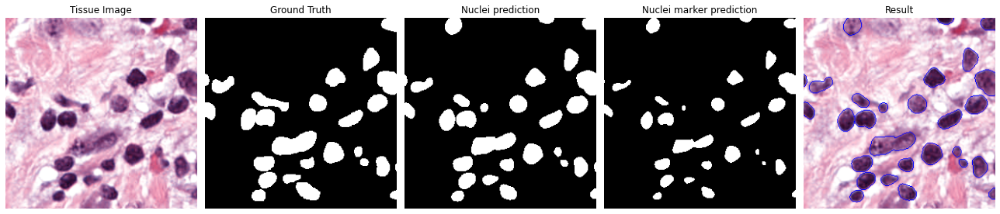

Epoch 30/200
147/147 [==============================] - ETA: 0s - loss: 0.9897 - Binary_segmentation_loss: 0.5128 - MultiClass_segmentation_loss: 0.4769 - Binary_segmentation_dice_coef: 0.8457 - MultiClass_segmentation_dice_coef: 0.8558
Epoch 30: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 926ms/step - loss: 0.9897 - Binary_segmentation_loss: 0.5128 - MultiClass_segmentation_loss: 0.4769 - Binary_segmentation_dice_coef: 0.8457 - MultiClass_segmentation_dice_coef: 0.8558 - val_loss: 1.2843 - val_Binary_segmentation_loss: 0.6234 - val_MultiClass_segmentation_loss: 0.6609 - val_Binary_segmentation_dice_coef: 0.8033 - val_MultiClass_segmentation_dice_coef: 0.7903 - lr: 1.0000e-04


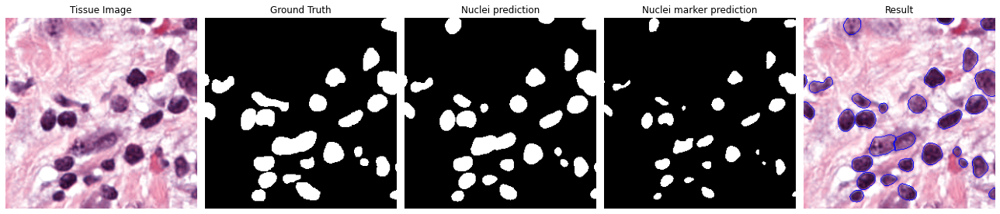

Epoch 31/200
147/147 [==============================] - ETA: 0s - loss: 1.0023 - Binary_segmentation_loss: 0.5159 - MultiClass_segmentation_loss: 0.4863 - Binary_segmentation_dice_coef: 0.8446 - MultiClass_segmentation_dice_coef: 0.8518
Epoch 31: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 924ms/step - loss: 1.0023 - Binary_segmentation_loss: 0.5159 - MultiClass_segmentation_loss: 0.4863 - Binary_segmentation_dice_coef: 0.8446 - MultiClass_segmentation_dice_coef: 0.8518 - val_loss: 1.2167 - val_Binary_segmentation_loss: 0.5927 - val_MultiClass_segmentation_loss: 0.6240 - val_Binary_segmentation_dice_coef: 0.8155 - val_MultiClass_segmentation_dice_coef: 0.8040 - lr: 1.0000e-04


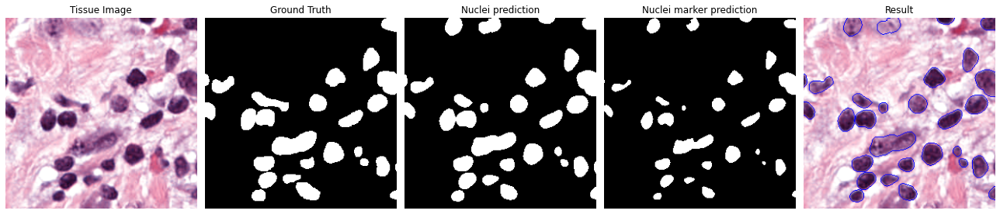

Epoch 32/200
147/147 [==============================] - ETA: 0s - loss: 0.9896 - Binary_segmentation_loss: 0.5126 - MultiClass_segmentation_loss: 0.4770 - Binary_segmentation_dice_coef: 0.8458 - MultiClass_segmentation_dice_coef: 0.8556
Epoch 32: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 926ms/step - loss: 0.9896 - Binary_segmentation_loss: 0.5126 - MultiClass_segmentation_loss: 0.4770 - Binary_segmentation_dice_coef: 0.8458 - MultiClass_segmentation_dice_coef: 0.8556 - val_loss: 1.2342 - val_Binary_segmentation_loss: 0.6072 - val_MultiClass_segmentation_loss: 0.6271 - val_Binary_segmentation_dice_coef: 0.8094 - val_MultiClass_segmentation_dice_coef: 0.8031 - lr: 1.0000e-04


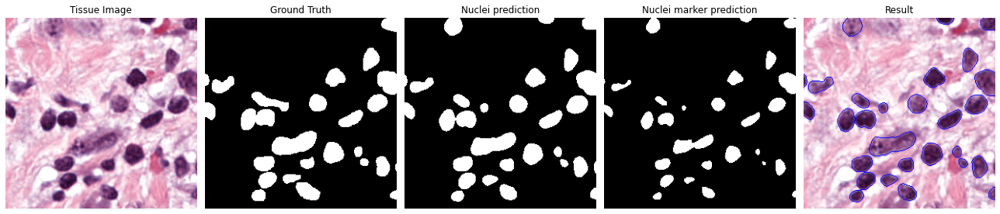

Epoch 33/200
147/147 [==============================] - ETA: 0s - loss: 0.9824 - Binary_segmentation_loss: 0.5075 - MultiClass_segmentation_loss: 0.4749 - Binary_segmentation_dice_coef: 0.8477 - MultiClass_segmentation_dice_coef: 0.8564
Epoch 33: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 925ms/step - loss: 0.9824 - Binary_segmentation_loss: 0.5075 - MultiClass_segmentation_loss: 0.4749 - Binary_segmentation_dice_coef: 0.8477 - MultiClass_segmentation_dice_coef: 0.8564 - val_loss: 1.2522 - val_Binary_segmentation_loss: 0.6231 - val_MultiClass_segmentation_loss: 0.6291 - val_Binary_segmentation_dice_coef: 0.8031 - val_MultiClass_segmentation_dice_coef: 0.8031 - lr: 1.0000e-04


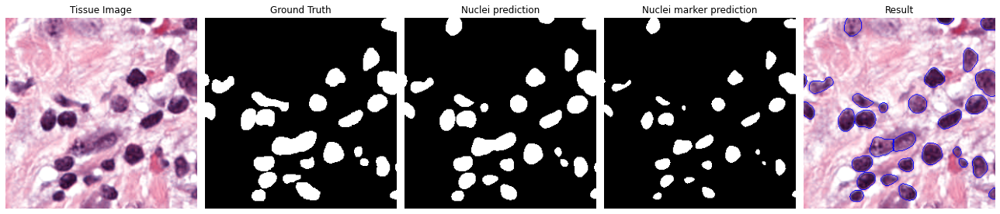

Epoch 34/200
147/147 [==============================] - ETA: 0s - loss: 0.9906 - Binary_segmentation_loss: 0.5088 - MultiClass_segmentation_loss: 0.4818 - Binary_segmentation_dice_coef: 0.8472 - MultiClass_segmentation_dice_coef: 0.8535
Epoch 34: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 924ms/step - loss: 0.9906 - Binary_segmentation_loss: 0.5088 - MultiClass_segmentation_loss: 0.4818 - Binary_segmentation_dice_coef: 0.8472 - MultiClass_segmentation_dice_coef: 0.8535 - val_loss: 1.2295 - val_Binary_segmentation_loss: 0.6052 - val_MultiClass_segmentation_loss: 0.6243 - val_Binary_segmentation_dice_coef: 0.8101 - val_MultiClass_segmentation_dice_coef: 0.8046 - lr: 1.0000e-04


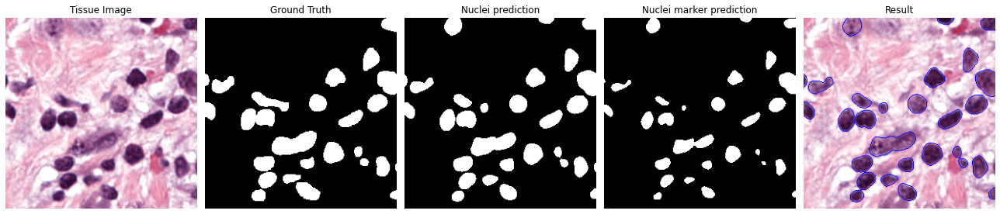

Epoch 35/200
147/147 [==============================] - ETA: 0s - loss: 0.9772 - Binary_segmentation_loss: 0.5044 - MultiClass_segmentation_loss: 0.4727 - Binary_segmentation_dice_coef: 0.8488 - MultiClass_segmentation_dice_coef: 0.8574
Epoch 35: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 924ms/step - loss: 0.9772 - Binary_segmentation_loss: 0.5044 - MultiClass_segmentation_loss: 0.4727 - Binary_segmentation_dice_coef: 0.8488 - MultiClass_segmentation_dice_coef: 0.8574 - val_loss: 1.2088 - val_Binary_segmentation_loss: 0.5938 - val_MultiClass_segmentation_loss: 0.6150 - val_Binary_segmentation_dice_coef: 0.8149 - val_MultiClass_segmentation_dice_coef: 0.8080 - lr: 1.0000e-04


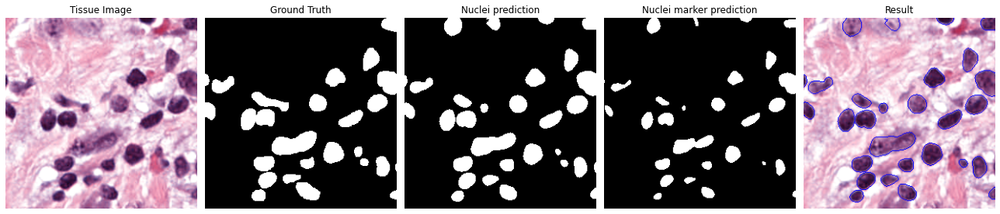

Epoch 36/200
147/147 [==============================] - ETA: 0s - loss: 0.9803 - Binary_segmentation_loss: 0.5072 - MultiClass_segmentation_loss: 0.4731 - Binary_segmentation_dice_coef: 0.8479 - MultiClass_segmentation_dice_coef: 0.8572
Epoch 36: val_loss did not improve from 1.17721

Epoch 36: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
147/147 [==============================] - 136s 925ms/step - loss: 0.9803 - Binary_segmentation_loss: 0.5072 - MultiClass_segmentation_loss: 0.4731 - Binary_segmentation_dice_coef: 0.8479 - MultiClass_segmentation_dice_coef: 0.8572 - val_loss: 1.3318 - val_Binary_segmentation_loss: 0.6664 - val_MultiClass_segmentation_loss: 0.6654 - val_Binary_segmentation_dice_coef: 0.7860 - val_MultiClass_segmentation_dice_coef: 0.7899 - lr: 1.0000e-04


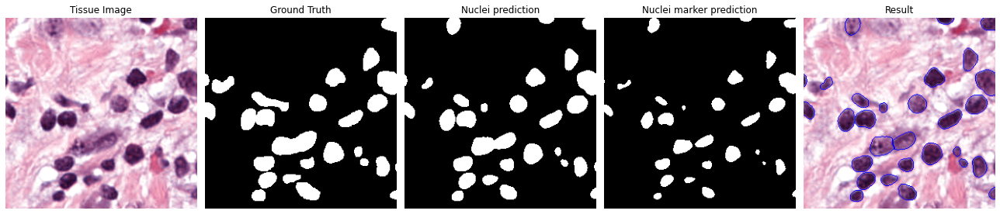

Epoch 37/200
147/147 [==============================] - ETA: 0s - loss: 0.9651 - Binary_segmentation_loss: 0.4986 - MultiClass_segmentation_loss: 0.4665 - Binary_segmentation_dice_coef: 0.8510 - MultiClass_segmentation_dice_coef: 0.8596
Epoch 37: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 924ms/step - loss: 0.9651 - Binary_segmentation_loss: 0.4986 - MultiClass_segmentation_loss: 0.4665 - Binary_segmentation_dice_coef: 0.8510 - MultiClass_segmentation_dice_coef: 0.8596 - val_loss: 1.2142 - val_Binary_segmentation_loss: 0.5957 - val_MultiClass_segmentation_loss: 0.6185 - val_Binary_segmentation_dice_coef: 0.8141 - val_MultiClass_segmentation_dice_coef: 0.8065 - lr: 1.0000e-05


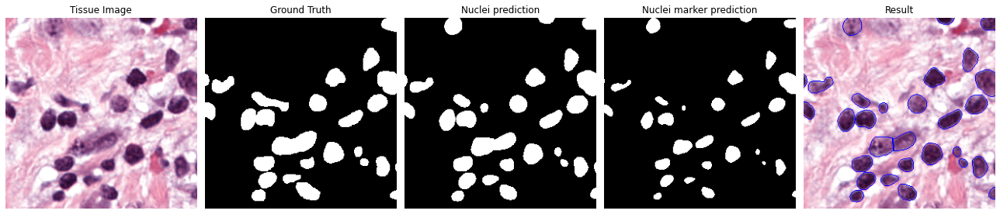

Epoch 38/200
147/147 [==============================] - ETA: 0s - loss: 0.9514 - Binary_segmentation_loss: 0.4911 - MultiClass_segmentation_loss: 0.4603 - Binary_segmentation_dice_coef: 0.8538 - MultiClass_segmentation_dice_coef: 0.8619
Epoch 38: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 924ms/step - loss: 0.9514 - Binary_segmentation_loss: 0.4911 - MultiClass_segmentation_loss: 0.4603 - Binary_segmentation_dice_coef: 0.8538 - MultiClass_segmentation_dice_coef: 0.8619 - val_loss: 1.1920 - val_Binary_segmentation_loss: 0.5841 - val_MultiClass_segmentation_loss: 0.6079 - val_Binary_segmentation_dice_coef: 0.8185 - val_MultiClass_segmentation_dice_coef: 0.8103 - lr: 1.0000e-05


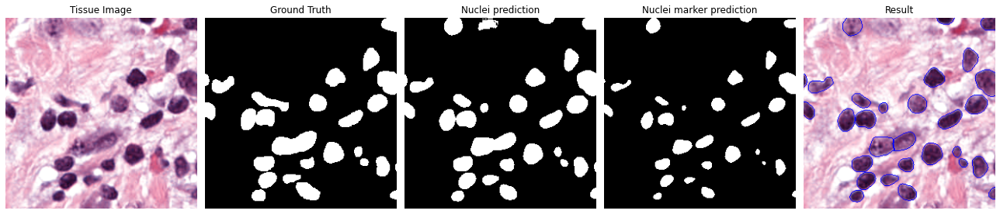

Epoch 39/200
147/147 [==============================] - ETA: 0s - loss: 0.9447 - Binary_segmentation_loss: 0.4886 - MultiClass_segmentation_loss: 0.4560 - Binary_segmentation_dice_coef: 0.8547 - MultiClass_segmentation_dice_coef: 0.8635
Epoch 39: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 924ms/step - loss: 0.9447 - Binary_segmentation_loss: 0.4886 - MultiClass_segmentation_loss: 0.4560 - Binary_segmentation_dice_coef: 0.8547 - MultiClass_segmentation_dice_coef: 0.8635 - val_loss: 1.2071 - val_Binary_segmentation_loss: 0.5931 - val_MultiClass_segmentation_loss: 0.6140 - val_Binary_segmentation_dice_coef: 0.8153 - val_MultiClass_segmentation_dice_coef: 0.8085 - lr: 1.0000e-05


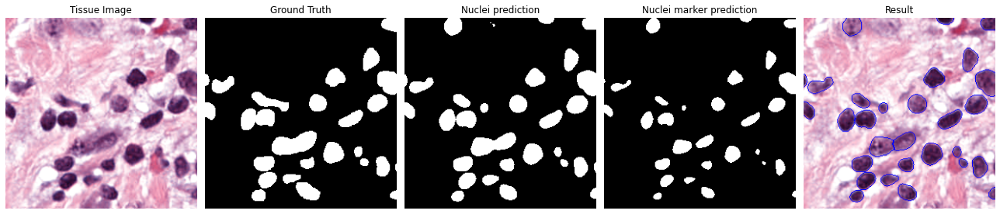

Epoch 40/200
147/147 [==============================] - ETA: 0s - loss: 0.9427 - Binary_segmentation_loss: 0.4867 - MultiClass_segmentation_loss: 0.4560 - Binary_segmentation_dice_coef: 0.8553 - MultiClass_segmentation_dice_coef: 0.8636
Epoch 40: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 925ms/step - loss: 0.9427 - Binary_segmentation_loss: 0.4867 - MultiClass_segmentation_loss: 0.4560 - Binary_segmentation_dice_coef: 0.8553 - MultiClass_segmentation_dice_coef: 0.8636 - val_loss: 1.2051 - val_Binary_segmentation_loss: 0.5911 - val_MultiClass_segmentation_loss: 0.6140 - val_Binary_segmentation_dice_coef: 0.8161 - val_MultiClass_segmentation_dice_coef: 0.8082 - lr: 1.0000e-05


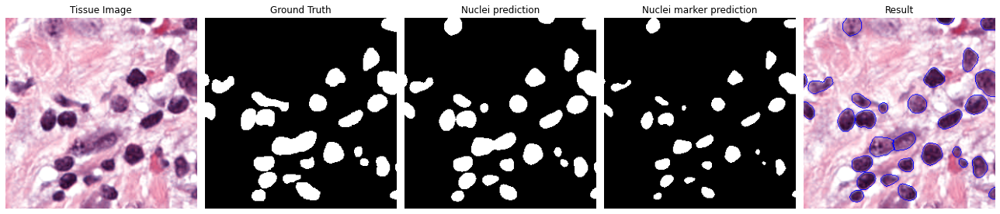

Epoch 41/200
147/147 [==============================] - ETA: 0s - loss: 0.9486 - Binary_segmentation_loss: 0.4904 - MultiClass_segmentation_loss: 0.4582 - Binary_segmentation_dice_coef: 0.8540 - MultiClass_segmentation_dice_coef: 0.8626
Epoch 41: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 925ms/step - loss: 0.9486 - Binary_segmentation_loss: 0.4904 - MultiClass_segmentation_loss: 0.4582 - Binary_segmentation_dice_coef: 0.8540 - MultiClass_segmentation_dice_coef: 0.8626 - val_loss: 1.2044 - val_Binary_segmentation_loss: 0.5906 - val_MultiClass_segmentation_loss: 0.6138 - val_Binary_segmentation_dice_coef: 0.8158 - val_MultiClass_segmentation_dice_coef: 0.8085 - lr: 1.0000e-05


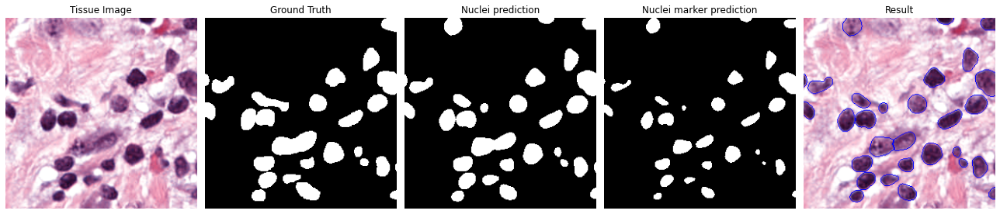

Epoch 42/200
147/147 [==============================] - ETA: 0s - loss: 0.9451 - Binary_segmentation_loss: 0.4881 - MultiClass_segmentation_loss: 0.4571 - Binary_segmentation_dice_coef: 0.8549 - MultiClass_segmentation_dice_coef: 0.8631
Epoch 42: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 925ms/step - loss: 0.9451 - Binary_segmentation_loss: 0.4881 - MultiClass_segmentation_loss: 0.4571 - Binary_segmentation_dice_coef: 0.8549 - MultiClass_segmentation_dice_coef: 0.8631 - val_loss: 1.1991 - val_Binary_segmentation_loss: 0.5875 - val_MultiClass_segmentation_loss: 0.6116 - val_Binary_segmentation_dice_coef: 0.8173 - val_MultiClass_segmentation_dice_coef: 0.8091 - lr: 1.0000e-05


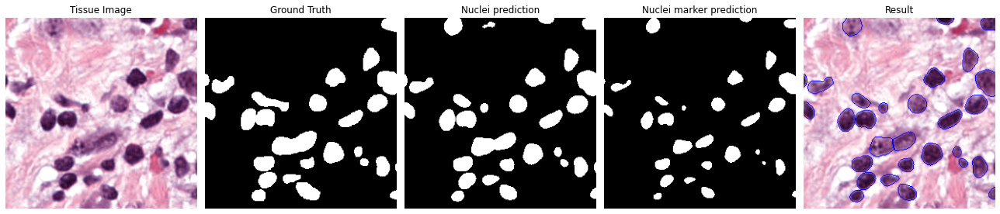

Epoch 43/200
147/147 [==============================] - ETA: 0s - loss: 0.9484 - Binary_segmentation_loss: 0.4881 - MultiClass_segmentation_loss: 0.4603 - Binary_segmentation_dice_coef: 0.8549 - MultiClass_segmentation_dice_coef: 0.8615
Epoch 43: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 925ms/step - loss: 0.9484 - Binary_segmentation_loss: 0.4881 - MultiClass_segmentation_loss: 0.4603 - Binary_segmentation_dice_coef: 0.8549 - MultiClass_segmentation_dice_coef: 0.8615 - val_loss: 1.2177 - val_Binary_segmentation_loss: 0.5975 - val_MultiClass_segmentation_loss: 0.6202 - val_Binary_segmentation_dice_coef: 0.8135 - val_MultiClass_segmentation_dice_coef: 0.8063 - lr: 1.0000e-05


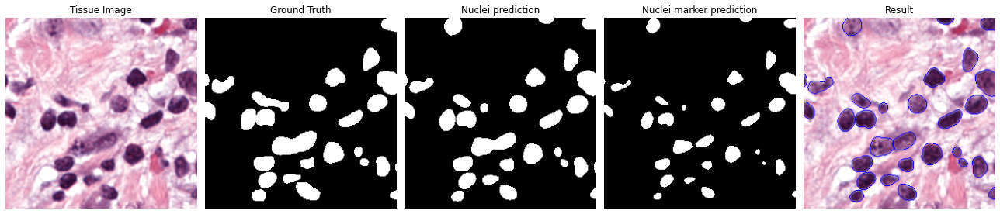

Epoch 44/200
147/147 [==============================] - ETA: 0s - loss: 0.9369 - Binary_segmentation_loss: 0.4835 - MultiClass_segmentation_loss: 0.4534 - Binary_segmentation_dice_coef: 0.8565 - MultiClass_segmentation_dice_coef: 0.8643
Epoch 44: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 926ms/step - loss: 0.9369 - Binary_segmentation_loss: 0.4835 - MultiClass_segmentation_loss: 0.4534 - Binary_segmentation_dice_coef: 0.8565 - MultiClass_segmentation_dice_coef: 0.8643 - val_loss: 1.2114 - val_Binary_segmentation_loss: 0.5934 - val_MultiClass_segmentation_loss: 0.6180 - val_Binary_segmentation_dice_coef: 0.8151 - val_MultiClass_segmentation_dice_coef: 0.8066 - lr: 1.0000e-05


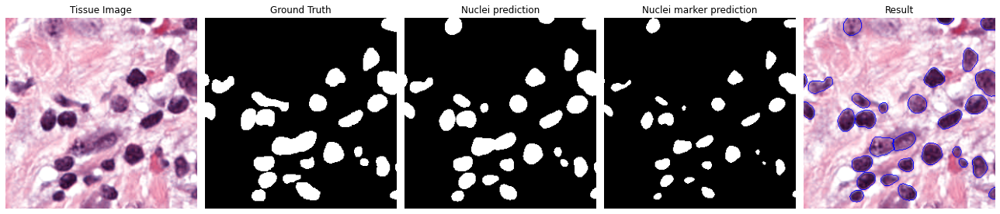

Epoch 45/200
147/147 [==============================] - ETA: 0s - loss: 0.9404 - Binary_segmentation_loss: 0.4806 - MultiClass_segmentation_loss: 0.4598 - Binary_segmentation_dice_coef: 0.8576 - MultiClass_segmentation_dice_coef: 0.8615
Epoch 45: val_loss did not improve from 1.17721
147/147 [==============================] - 136s 925ms/step - loss: 0.9404 - Binary_segmentation_loss: 0.4806 - MultiClass_segmentation_loss: 0.4598 - Binary_segmentation_dice_coef: 0.8576 - MultiClass_segmentation_dice_coef: 0.8615 - val_loss: 1.2194 - val_Binary_segmentation_loss: 0.5982 - val_MultiClass_segmentation_loss: 0.6212 - val_Binary_segmentation_dice_coef: 0.8132 - val_MultiClass_segmentation_dice_coef: 0.8059 - lr: 1.0000e-05


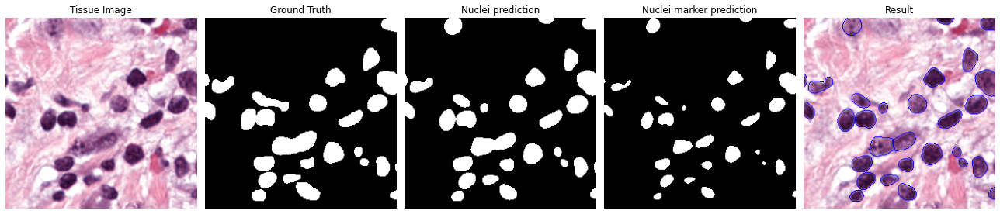

Epoch 46/200
147/147 [==============================] - ETA: 0s - loss: 0.9355 - Binary_segmentation_loss: 0.4833 - MultiClass_segmentation_loss: 0.4523 - Binary_segmentation_dice_coef: 0.8566 - MultiClass_segmentation_dice_coef: 0.8648
Epoch 46: val_loss did not improve from 1.17721

Epoch 46: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-07.
147/147 [==============================] - 136s 926ms/step - loss: 0.9355 - Binary_segmentation_loss: 0.4833 - MultiClass_segmentation_loss: 0.4523 - Binary_segmentation_dice_coef: 0.8566 - MultiClass_segmentation_dice_coef: 0.8648 - val_loss: 1.2246 - val_Binary_segmentation_loss: 0.6025 - val_MultiClass_segmentation_loss: 0.6222 - val_Binary_segmentation_dice_coef: 0.8113 - val_MultiClass_segmentation_dice_coef: 0.8053 - lr: 1.0000e-05


In [ ]:
epochs = 200

# Generators
training_generator = DataGenerator(train_images, train_masks, train_masks_cat, augmentations=AUGMENTATIONS_TRAIN, batch_size=8)
validation_generator = DataGenerator(val_images, val_masks, val_masks_cat, augmentations=AUGMENTATIONS_VAL, batch_size=8)

history = model.fit(training_generator,
                    validation_data=validation_generator,                        
                    epochs=epochs,
                    verbose=1,
                    callbacks=callbacks)